In [1]:
#import all the necessary packages.
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [2]:
from pprint import pprint
data = pd.read_json(r'C:\Users\aaans\OneDrive\Desktop\AmazonData\archive\tops_fashion.json')
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

pprint(data.columns)
data.to_pickle('pickels/180k_apparel_data')

Number of data points :  183138 Number of features/variables: 19
Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')


Of these 19 features, we will be using only 6 features in this workshop.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [3]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head()

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


In [4]:
data = pd.read_pickle('pickels/180k_apparel_data')

# Data Preprocessing

### Removing Null Values

In [5]:
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

data.to_pickle('pickels/28k_apparel_data')

Number of data points After eliminating price=NULL : 28395
Number of data points After eliminating color=NULL : 28385


In [6]:
#for dowloading images from the json file containg the links of the images 
'''from PIL import Image
import requests
from io import BytesIO

for index,row in data.iterrows():
        url = row['medium_image_url']
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img.save('images/'+row['asin']+'.jpeg')'''

"from PIL import Image\nimport requests\nfrom io import BytesIO\n\nfor index,row in data.iterrows():\n        url = row['medium_image_url']\n        response = requests.get(url)\n        img = Image.open(BytesIO(response.content))\n        img.save('images/'+row['asin']+'.jpeg')"

### Removing the products with short description

In [7]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


### Removing the products with duplicate title by sorting 

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [8]:
data = pd.read_pickle('pickels/28k_apparel_data')
print('The number of entries with duplicate title is %d'%sum(data.duplicated('title')))
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)

indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:    
    previous_i = i
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()
    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()
        # store the maximum length of two strings
        length = max(len(a), len(b))
        # count is used to store the number of words that are matched in both strings
        count  = 0
        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1
        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])
            # if the comaprision between is between num_data_points, num_data_points-1 strings and they differ in more than 2 words we include both
            if j == num_data_points-1: stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[j]])
            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

data = data.loc[data['asin'].isin(stage1_dedupe_asins)]
print('Number of data points now is: ', data.shape[0])
data.to_pickle('pickels/17k_apparrel_data')

The number of entries with duplicate title is 2325
Number of data points now is:  17593


<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [9]:
# below code takes a lot of time about 1hr hence commented and processed pickle file saved
'''
data = pd.read_pickle('pickels/17k_apparrel_data')
indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        length = max(len(a),len(b))        
        # count is used to store the number of words that are matched in both strings
        count  = 0
        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1
        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)
            
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]
print('Number of data points after stage two of dedupe: ',data.shape[0])
data.to_pickle('pickels/16k_apperal_data')'''

"\ndata = pd.read_pickle('pickels/17k_apparrel_data')\nindices = []\nfor i,row in data.iterrows():\n    indices.append(i)\n\nstage2_dedupe_asins = []\nwhile len(indices)!=0:\n    i = indices.pop()\n    stage2_dedupe_asins.append(data['asin'].loc[i])\n    # consider the first apperal's title\n    a = data['title'].loc[i].split()\n    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']\n    for j in indices:        \n        b = data['title'].loc[j].split()\n        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']\n        length = max(len(a),len(b))        \n        # count is used to store the number of words that are matched in both strings\n        count  = 0\n        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings\n        # example: a =['a', '

### Go to [Saved 16k_apparel_data](https://drive.google.com/open?id=1yDZDY2Y-4VvPSxJeCyPhqhxfNtAW9e6j)
<pre>
And create a folder named pickels and move this file into this folder
</pre>

# Text Preprocessing

In [11]:
data = pd.read_pickle(r'C:\Users\aaans\OneDrive\Desktop\AmazonData\pickels\pickels\16k_apperal_data')
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'in', 'hadn', 'to', "that'll", 'doesn', 'ma', 'its', 'or', 'were', 'shouldn', "isn't", 'under', 'after', 'than', "don't", 'myself', 'should', 'my', 'but', 'from', 'until', 'whom', 'wouldn', 'too', "aren't", 'be', 'before', 'by', 'she', 'here', 'he', 'not', 'once', 'aren', "you'll", 'shan', 'some', "hasn't", 'me', 'who', 'now', 'did', 'a', 'while', 'didn', "should've", 'very', 'above', 'this', "wouldn't", "shan't", 'both', 'most', 'we', 'the', 'against', 'between', 'can', 'itself', 'herself', 'i', 'does', "didn't", 'll', 'about', "shouldn't", 's', 'each', 'haven', 'ours', 'has', 'where', 'ourselves', 'couldn', 'more', "couldn't", 'only', 'below', "it's", 'during', 'with', 'down', 'which', 'have', 'there', "she's", 'further', 'will', 'any', 'other', 'up', 'needn', 'd', "you're", "weren't", "wasn't", 'same', 'are', 'these', 'of', 'no', 'own', 've', 'do', 'themselves', "needn't", "hadn't", 'is', 'how', 'their', 'an', 'o', 'when', 't', "mustn't", 'it', "you'd", 'his', '

In [24]:
start_time = time.time()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.time() - start_time, "seconds")

data.head()
data.to_pickle('pickels/16k_apparel_data_preprocessed')

10.69892168045044 seconds


In [13]:
# Utility Functions

#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)

#plotting code to understand the decision  
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url
        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):
    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf
    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 
    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0
    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    plot_heatmap(keys, values, labels, url, text)

# this function gets a list of wrods along with the frequency of each word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' 
    #this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, 
    #it returns dict type object {word1:count}

def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)
    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)
    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

## 1.Bag of Words model on Product Titles

In [14]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns 
# the a sparase matrix of dimensions #data_points * #words_in_corpus
bag_of_words_euclidean=[]
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        bag_of_words_euclidean.append(pdists[i])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)
    print('Average euclidean distance is ',sum(bag_of_words_euclidean)/num_results)



Getting the similar items for document id and number of items


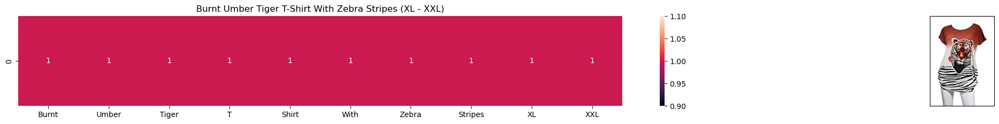

ASIN : B00JXQB5FQ
Brand: Si Row
Title: Burnt Umber Tiger T-Shirt With Zebra Stripes (XL - XXL)
Euclidean similarity with the query image : 0.0


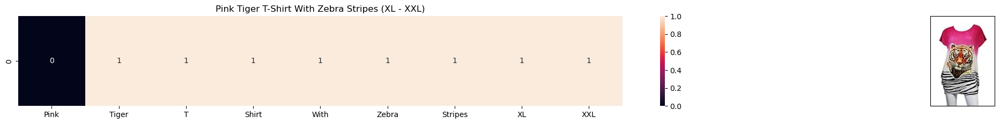

ASIN : B00JXQASS6
Brand: Si Row
Title: Pink Tiger T-Shirt With Zebra Stripes (XL - XXL)
Euclidean similarity with the query image : 1.7320508075688772


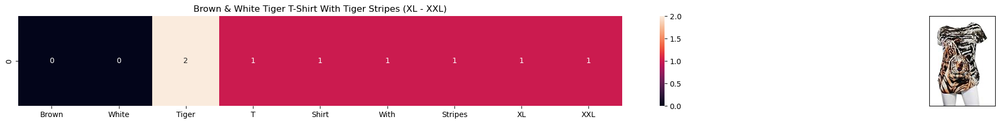

ASIN : B00JXQCWTO
Brand: Si Row
Title: Brown & White Tiger T-Shirt With Tiger Stripes (XL - XXL)
Euclidean similarity with the query image : 2.449489742783178


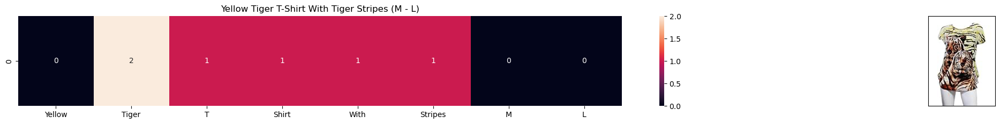

ASIN : B00JXQCUIC
Brand: Si Row
Title: Yellow Tiger T-Shirt With Tiger Stripes (M - L)
Euclidean similarity with the query image : 2.6457513110645907


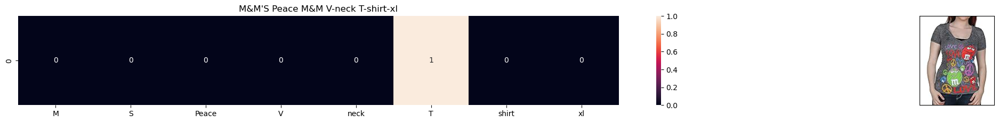

ASIN : B00MV1DUFI
Brand: Mad Engine
Title: M&M'S Peace M&M V-neck T-shirt-xl
Euclidean similarity with the query image : 3.0


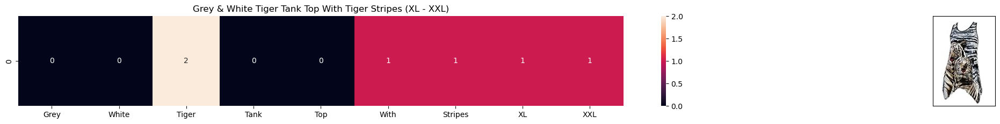

ASIN : B00JXQAFZ2
Brand: Si Row
Title: Grey & White Tiger Tank Top With Tiger Stripes (XL - XXL)
Euclidean similarity with the query image : 3.0


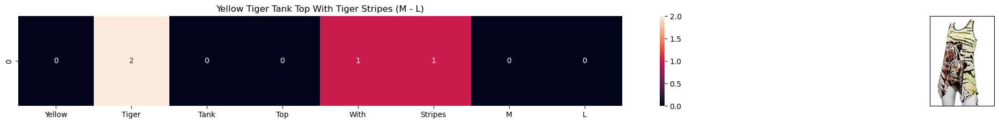

ASIN : B00JXQAUWA
Brand: Si Row
Title: Yellow Tiger Tank Top With Tiger Stripes (M - L)
Euclidean similarity with the query image : 3.1622776601683795


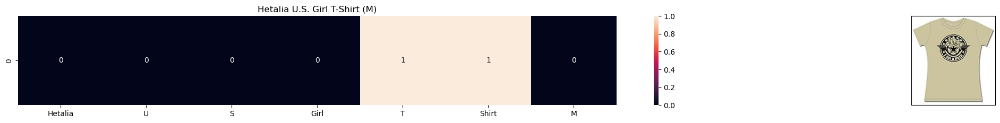

ASIN : B005IT8OBA
Brand: Hetalia
Title: Hetalia U.S. Girl T-Shirt (M)
Euclidean similarity with the query image : 3.1622776601683795


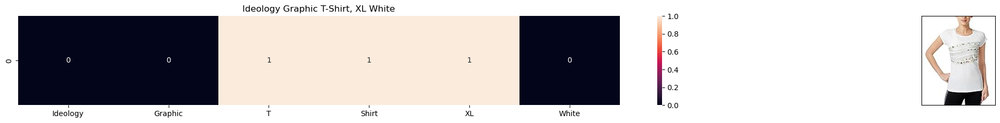

ASIN : B01NB0NKRO
Brand: Ideology
Title: Ideology Graphic T-Shirt, XL White
Euclidean similarity with the query image : 3.1622776601683795


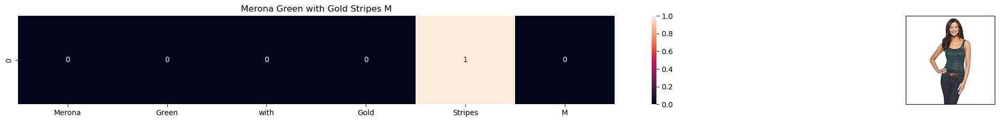

ASIN : B01KVZUB6G
Brand: Merona
Title: Merona Green with Gold Stripes M
Euclidean similarity with the query image : 3.1622776601683795


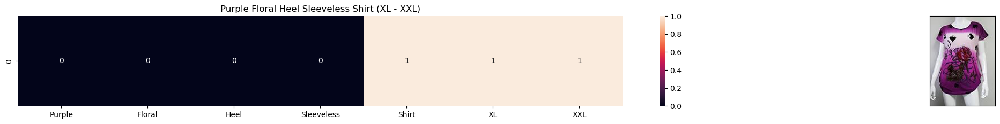

ASIN : B00JV63VC8
Brand: Si Row
Title: Purple Floral Heel Sleeveless Shirt (XL - XXL)
Euclidean similarity with the query image : 3.1622776601683795


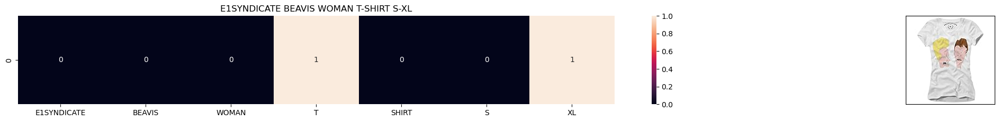

ASIN : B01HZX2GQ0
Brand: E1SYNDICATE
Title: E1SYNDICATE BEAVIS WOMAN T-SHIRT S-XL
Euclidean similarity with the query image : 3.1622776601683795


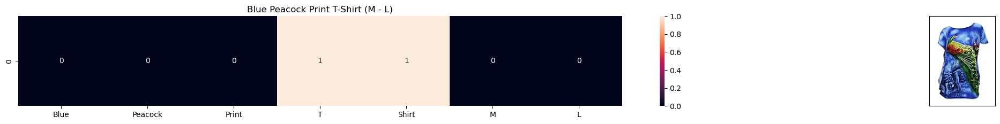

ASIN : B00JXQC8L6
Brand: Si Row
Title: Blue Peacock Print T-Shirt (M - L)
Euclidean similarity with the query image : 3.3166247903554


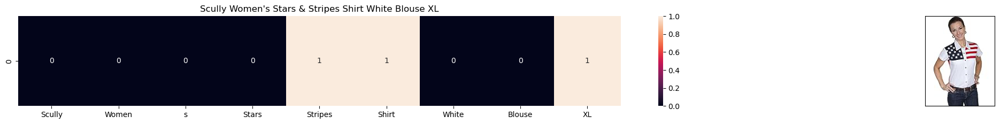

ASIN : B0059F5W9U
Brand: Scully
Title: Scully Women's Stars & Stripes Shirt White Blouse XL
Euclidean similarity with the query image : 3.3166247903554


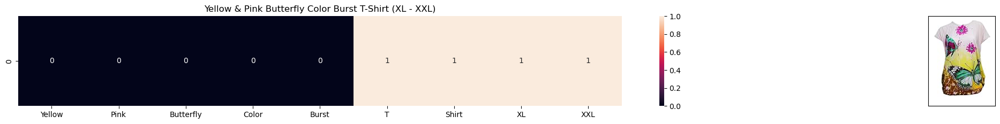

ASIN : B00JXQBBMI
Brand: Si Row
Title: Yellow & Pink Butterfly Color Burst T-Shirt (XL - XXL)
Euclidean similarity with the query image : 3.3166247903554


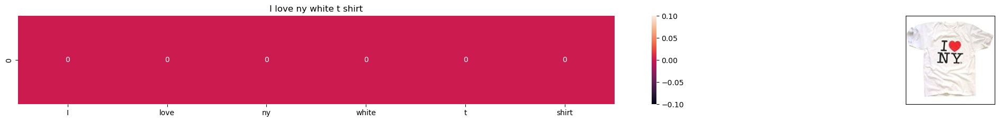

ASIN : B007N3WV6I
Brand: Forgot My Souvenirs
Title: I love ny white t shirt
Euclidean similarity with the query image : 3.3166247903554


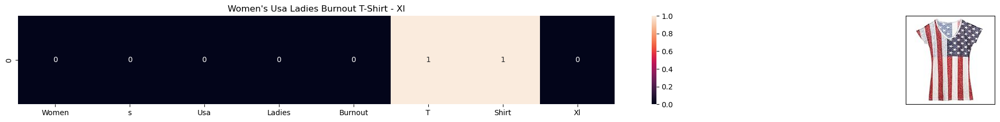

ASIN : B01F4D9CI8
Brand: Calhoun Sportswear
Title: Women's Usa Ladies Burnout T-Shirt - Xl
Euclidean similarity with the query image : 3.3166247903554


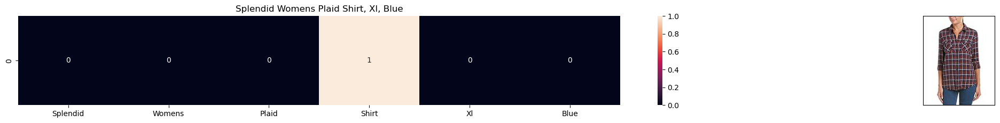

ASIN : B072KNKP98
Brand: Splendid
Title: Splendid Womens Plaid Shirt, Xl, Blue
Euclidean similarity with the query image : 3.3166247903554


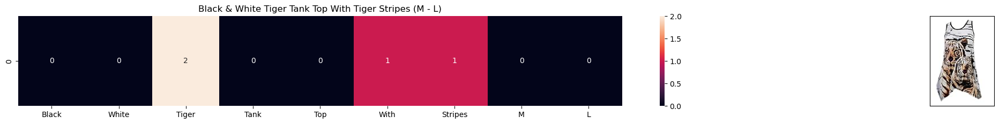

ASIN : B00JXQAO94
Brand: Si Row
Title: Black & White Tiger Tank Top With Tiger Stripes (M - L)
Euclidean similarity with the query image : 3.3166247903554


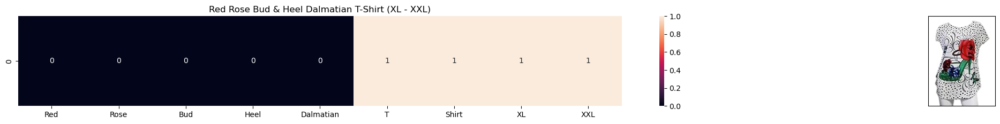

ASIN : B00JXQABB0
Brand: Si Row
Title: Red Rose Bud & Heel Dalmatian T-Shirt (XL - XXL)
Euclidean similarity with the query image : 3.3166247903554
Average euclidean distance is  2.9166978072635055


In [15]:
#call the bag-of-words model for a product to get similar products.
print('Getting the similar items for document id and number of items')
bag_of_words_model(12566, 20)
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.

## 2.TF-IDF BASED PRODUCT SIMILARITY

In [19]:

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import pairwise_distances

# Assuming data is a DataFrame that contains a column 'title'

# Initialize TfidfVectorizer with a valid min_df parameter
tfidf_title_vectorizer = TfidfVectorizer(min_df=1)

# Fit and transform the data
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])

# Function to get the most similar documents
tf_idf_euclidean = []

def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in the given corpus
    
    # Compute pairwise distances from the given document to all other documents
    pairwise_dist = pairwise_distances(tfidf_title_features, tfidf_title_features[doc_id])

    # Get the indices of the num_results smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    # Data frame indices of the num_results smallest distances
    df_indices = list(data.index[indices])

    for i in range(len(indices)):
        # Get and print results
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :', data['asin'].loc[df_indices[i]])
        print('BRAND :', data['brand'].loc[df_indices[i]])
        tf_idf_euclidean.append(pdists[i])
        print('Euclidean distance from the given image :', pdists[i])
        print('=' * 125)
    
    print('Average Euclidean distance is', sum(tf_idf_euclidean) / num_results)



Getting the similar items for document id and number of items


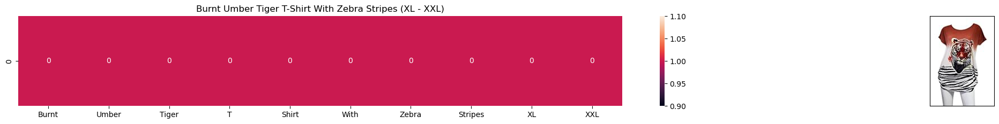

ASIN : B00JXQB5FQ
BRAND : Si Row
Euclidean distance from the given image : 0.0


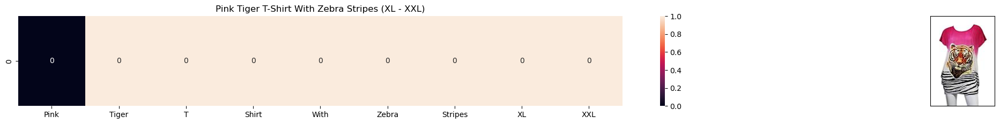

ASIN : B00JXQASS6
BRAND : Si Row
Euclidean distance from the given image : 0.7366684087528734


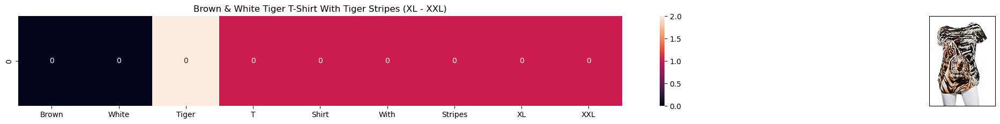

ASIN : B00JXQCWTO
BRAND : Si Row
Euclidean distance from the given image : 0.9152838866423482


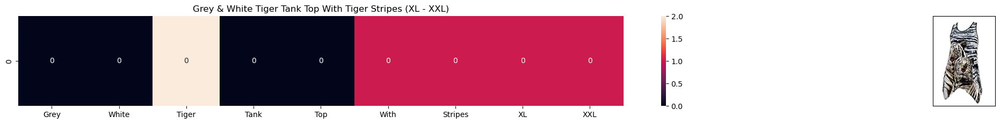

ASIN : B00JXQAFZ2
BRAND : Si Row
Euclidean distance from the given image : 0.9270707789369153


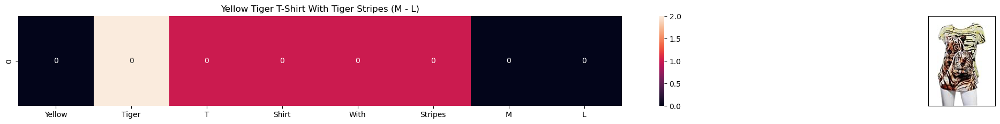

ASIN : B00JXQCUIC
BRAND : Si Row
Euclidean distance from the given image : 0.975523721846679


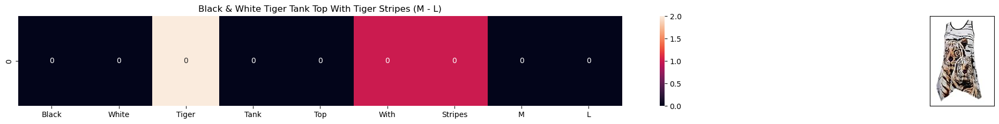

ASIN : B00JXQAO94
BRAND : Si Row
Euclidean distance from the given image : 0.9874640783621033


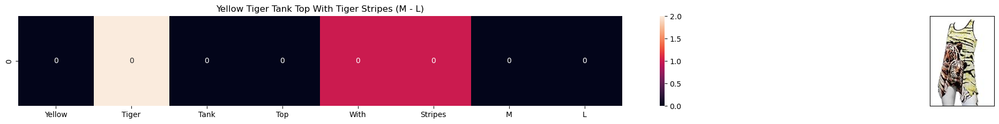

ASIN : B00JXQAUWA
BRAND : Si Row
Euclidean distance from the given image : 0.9970486356473023


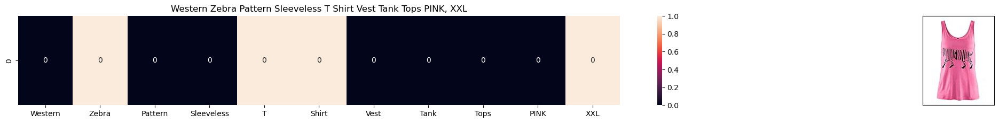

ASIN : B00Z6HEXWI
BRAND : Black Temptation
Euclidean distance from the given image : 1.2119107534358333


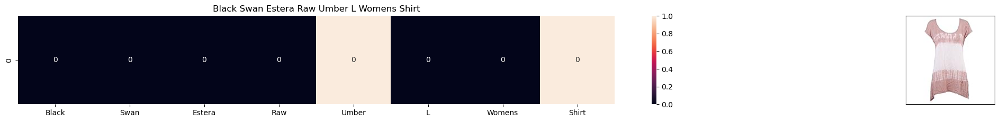

ASIN : B06Y1VN8WQ
BRAND : Black Swan
Euclidean distance from the given image : 1.21220486924041


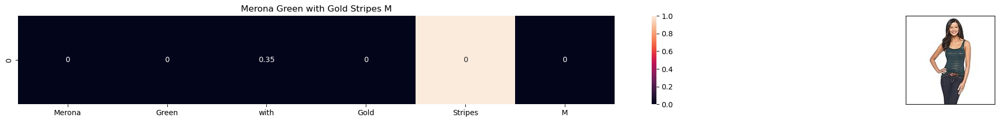

ASIN : B01KVZUB6G
BRAND : Merona
Euclidean distance from the given image : 1.2124162411533244


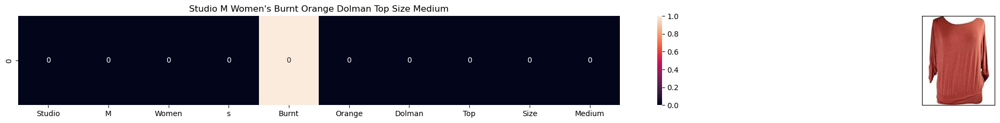

ASIN : B06XSCVFT5
BRAND : Studio M
Euclidean distance from the given image : 1.213691736934411


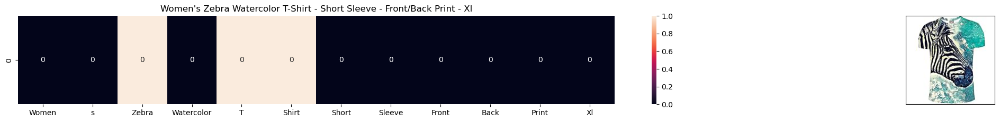

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
Euclidean distance from the given image : 1.2273382321865436


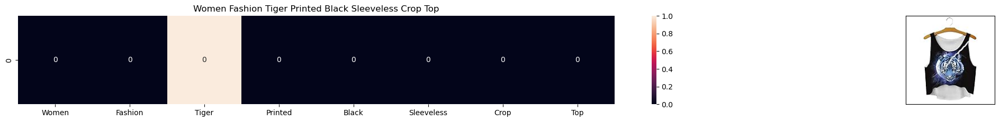

ASIN : B074T8ZYGX
BRAND : MKP Crop Top
Euclidean distance from the given image : 1.23123874934755


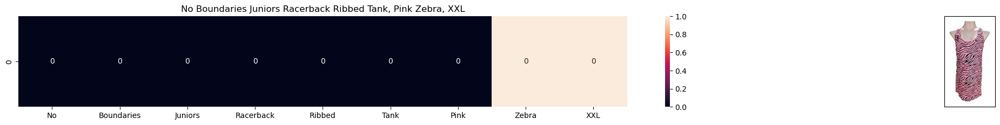

ASIN : B06Y2GTYPM
BRAND : No Boundaries
Euclidean distance from the given image : 1.233676763338542


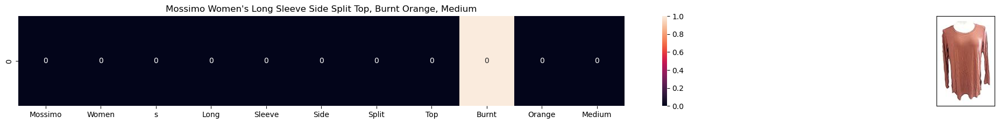

ASIN : B071ZDF6T2
BRAND : Mossimo
Euclidean distance from the given image : 1.2345232325046989


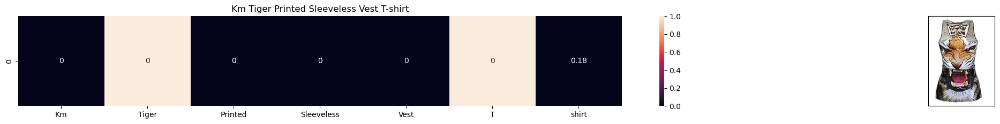

ASIN : B012VQLT6Y
BRAND : KM T-shirt
Euclidean distance from the given image : 1.2356522283409512


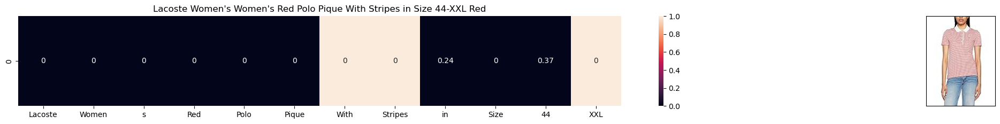

ASIN : B01M9GPRIC
BRAND : Lacoste
Euclidean distance from the given image : 1.237104772924502


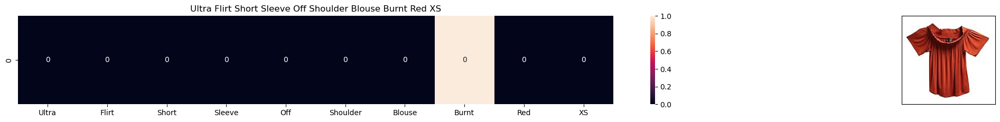

ASIN : B074TR12BH
BRAND : Ultra Flirt
Euclidean distance from the given image : 1.2414551645718515


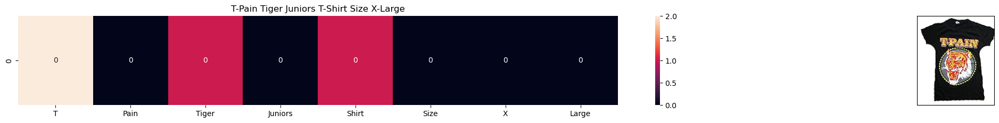

ASIN : B01K0H02OG
BRAND : Tultex
Euclidean distance from the given image : 1.2422814638415205


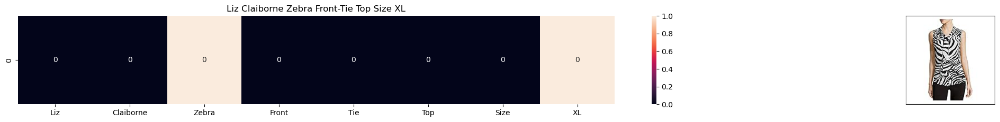

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
Euclidean distance from the given image : 1.242920722278503
Average Euclidean distance is 1.075773722014343


In [20]:
print('Getting the similar items for document id and number of items')
tfidf_model(12566, 20)

## 3. IDF BASED PRODUCT SIMILARITY

In [21]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

In [22]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [26]:
import math
import numpy as np

# Example definition of n_containing
def n_containing(word):
    return sum(1 for doc in data if word in doc)

# Updated idf function
def idf(word):
    # Ensure denominator is at least 1 to avoid division by zero
    containing_count = n_containing(word)
    if containing_count == 0:
        containing_count = 1
    return math.log(data.shape[0] / containing_count)

idf_title_features = idf_title_features.astype(np.float64)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j, idf_title_vectorizer.vocabulary_[i]] = idf_val


In [27]:
idf_euclidean=[]
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        idf_euclidean.append(pdists[i])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)
    print('Average euclidean distance is ',sum(idf_euclidean)/num_results)

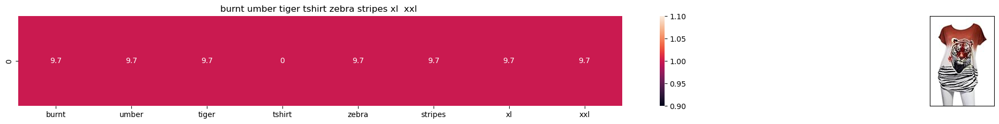

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from the given image : 0.0


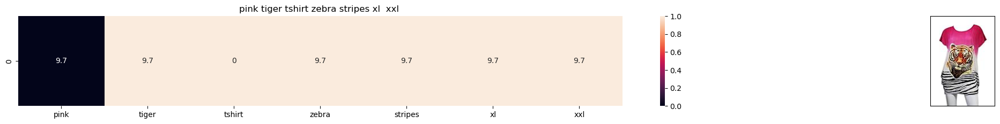

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from the given image : 16.77138832119707


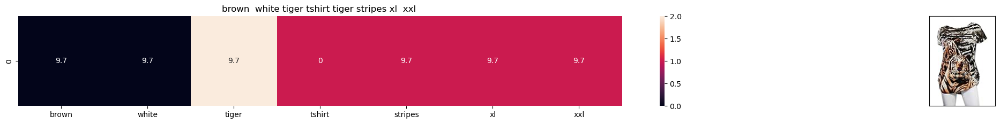

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from the given image : 21.651769220257936


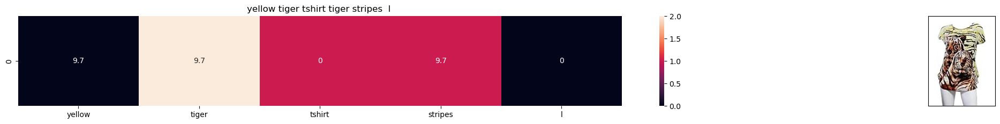

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from the given image : 23.718324823662627


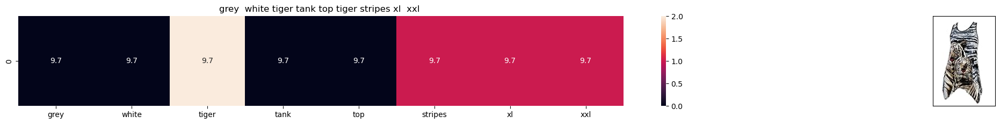

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from the given image : 27.387562443337202


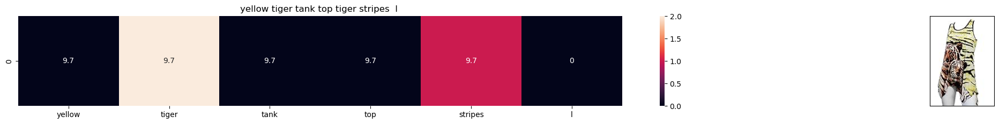

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from the given image : 29.048896685780615


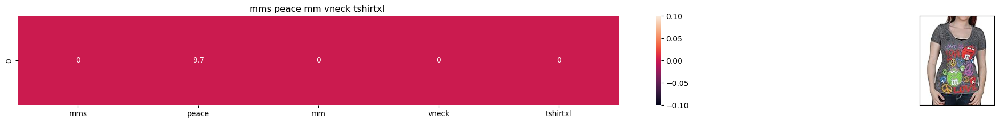

ASIN : B00MV1DUFI
Brand : Mad Engine
euclidean distance from the given image : 29.048896685780615


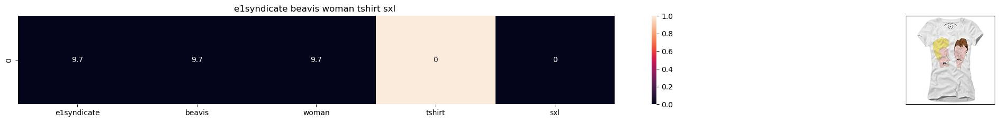

ASIN : B01HZX2GQ0
Brand : E1SYNDICATE
euclidean distance from the given image : 30.620225680661104


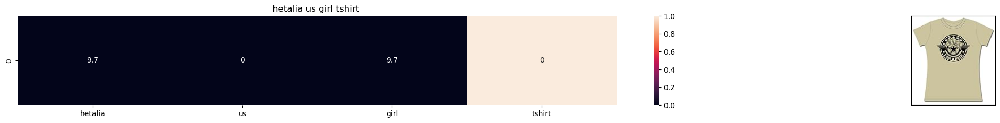

ASIN : B005IT8OBA
Brand : Hetalia
euclidean distance from the given image : 30.620225680661104


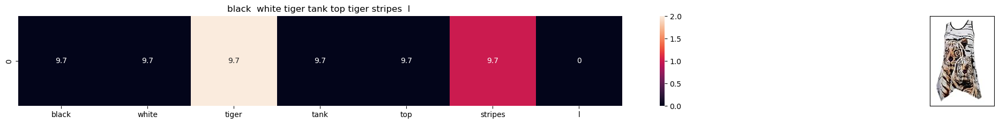

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from the given image : 30.620225680661104


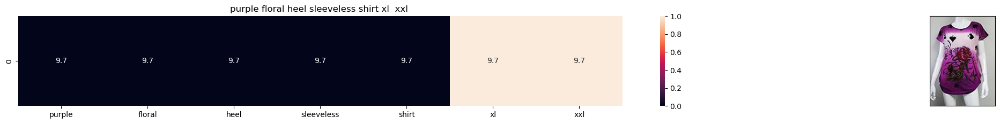

ASIN : B00JV63VC8
Brand : Si Row
euclidean distance from the given image : 30.620225680661104


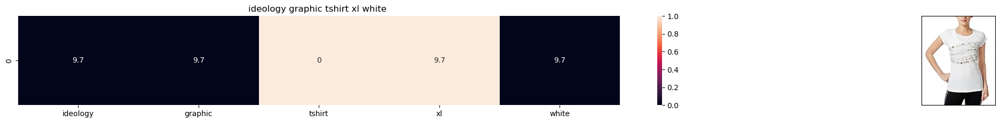

ASIN : B01NB0NKRO
Brand : Ideology
euclidean distance from the given image : 30.620225680661104


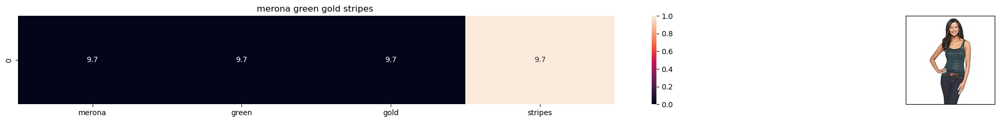

ASIN : B01KVZUB6G
Brand : Merona
euclidean distance from the given image : 30.620225680661104


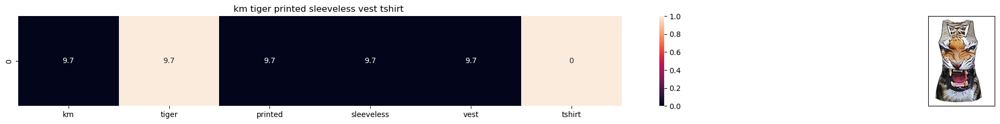

ASIN : B012VQLT6Y
Brand : KM T-shirt
euclidean distance from the given image : 32.114763626844265


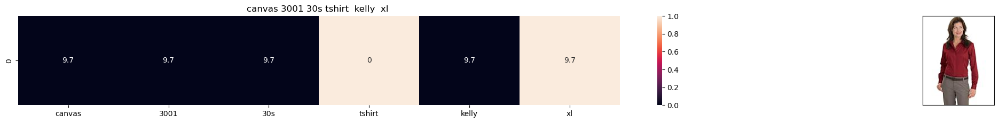

ASIN : B0088PN0LA
Brand : Red House
euclidean distance from the given image : 32.114763626844265


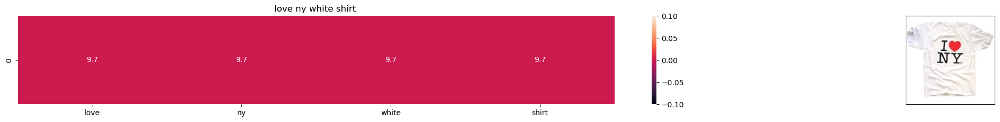

ASIN : B007N3WV6I
Brand : Forgot My Souvenirs
euclidean distance from the given image : 32.114763626844265


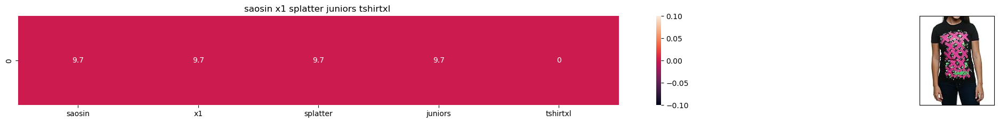

ASIN : B00BEL2548
Brand : FEA Merchandising
euclidean distance from the given image : 32.114763626844265


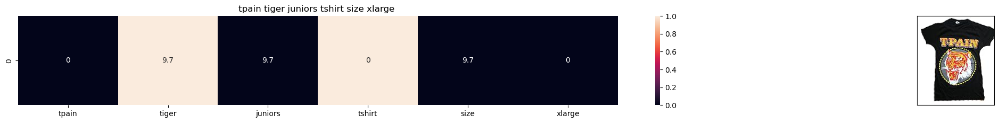

ASIN : B01K0H02OG
Brand : Tultex
euclidean distance from the given image : 32.114763626844265


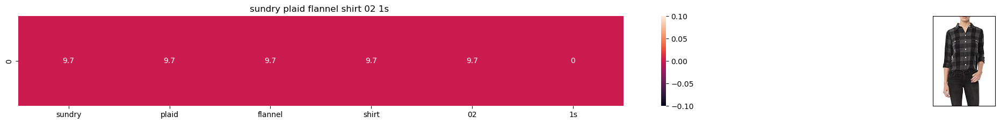

ASIN : B074ZPBJDR
Brand : SUNDRY
euclidean distance from the given image : 32.114763626844265


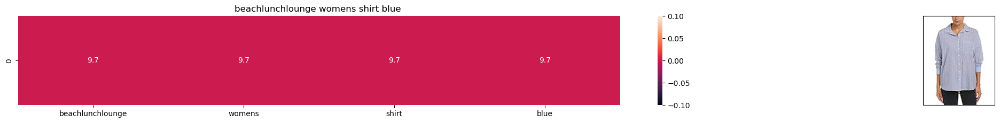

ASIN : B074SZ54KJ
Brand : Beach Lunch Lounge
euclidean distance from the given image : 32.114763626844265
Average euclidean distance is  27.807576882594624


In [28]:
idf_model(12566,20)

### Go to [Trained word2vec model](https://drive.google.com/file/d/1FByX9HSM8KhNL0rdp3jWD_xpmbVt8Dy0/view?usp=sharing)

## 4.TEXT SEMANTICS BASED PRODUCT SIMILARITY

In [22]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)
    

In [30]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [24]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if we are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

#### AVERAGE WORD2VEC PRODUCT SIMILARITY

In [32]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)

NameError: name 'build_avg_vec' is not defined

In [26]:
avg_w2v_euclidean=[]
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        avg_w2v_euclidean.append(pdists[i])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)
    print('Average euclidean distance is ',sum(avg_w2v_euclidean)/num_results)

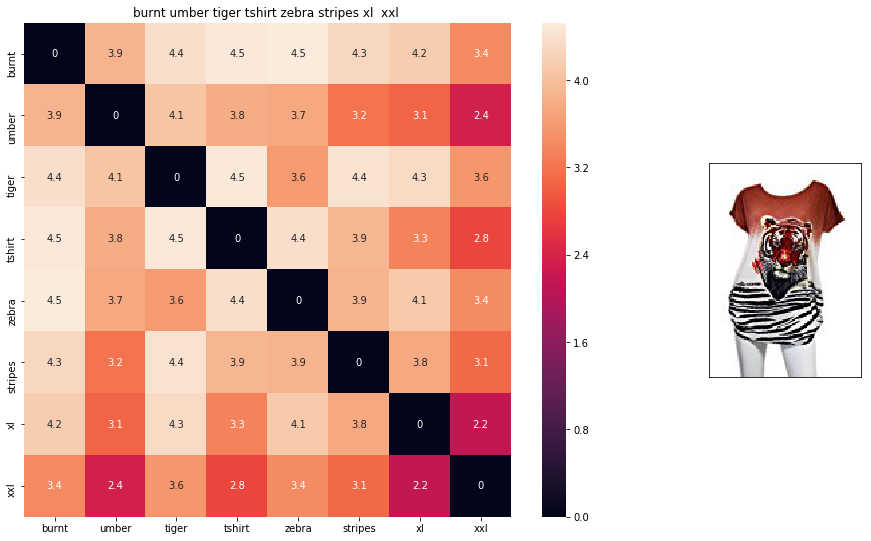

ASIN : B00JXQB5FQ
BRAND : Si Row
euclidean distance from given input image : 0.00069053395


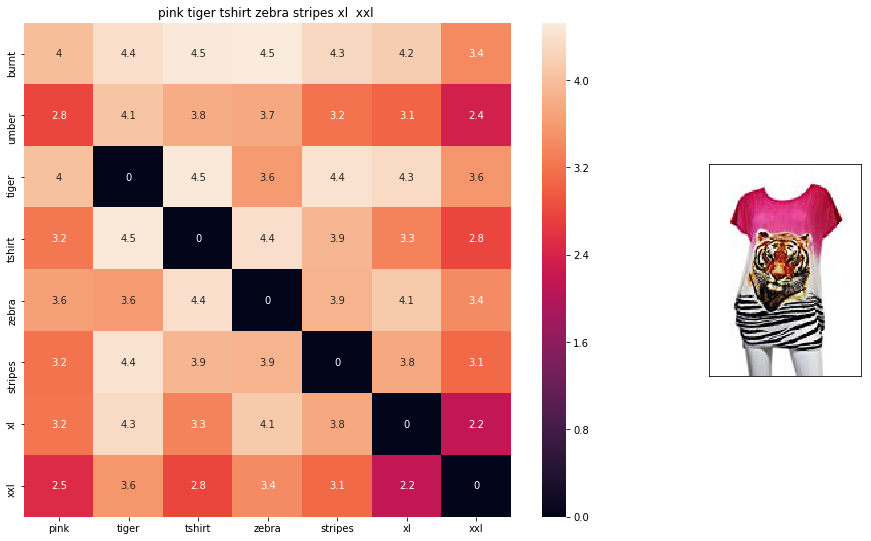

ASIN : B00JXQASS6
BRAND : Si Row
euclidean distance from given input image : 0.5891932


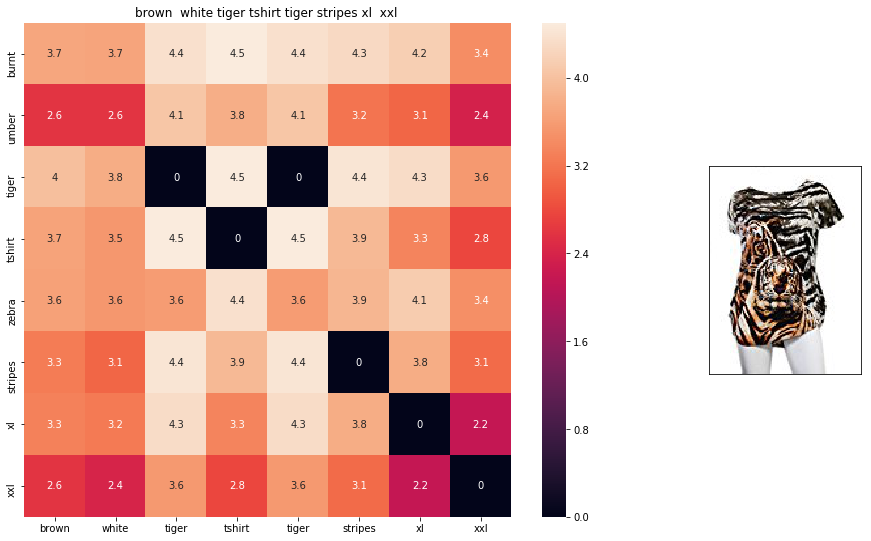

ASIN : B00JXQCWTO
BRAND : Si Row
euclidean distance from given input image : 0.7003439


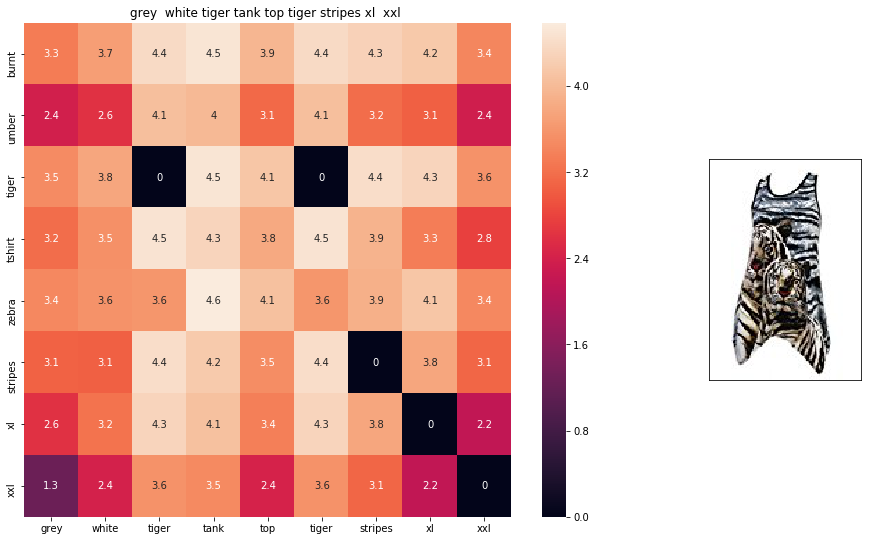

ASIN : B00JXQAFZ2
BRAND : Si Row
euclidean distance from given input image : 0.8928398


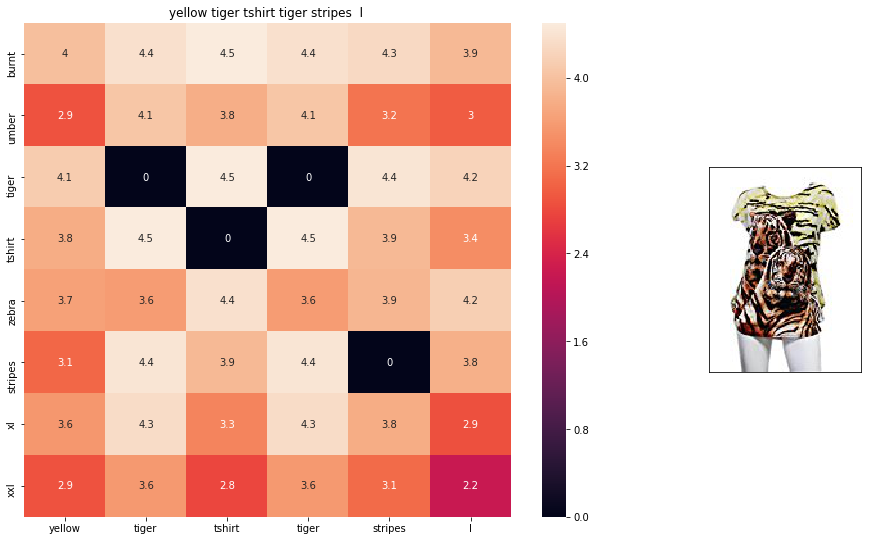

ASIN : B00JXQCUIC
BRAND : Si Row
euclidean distance from given input image : 0.95601267


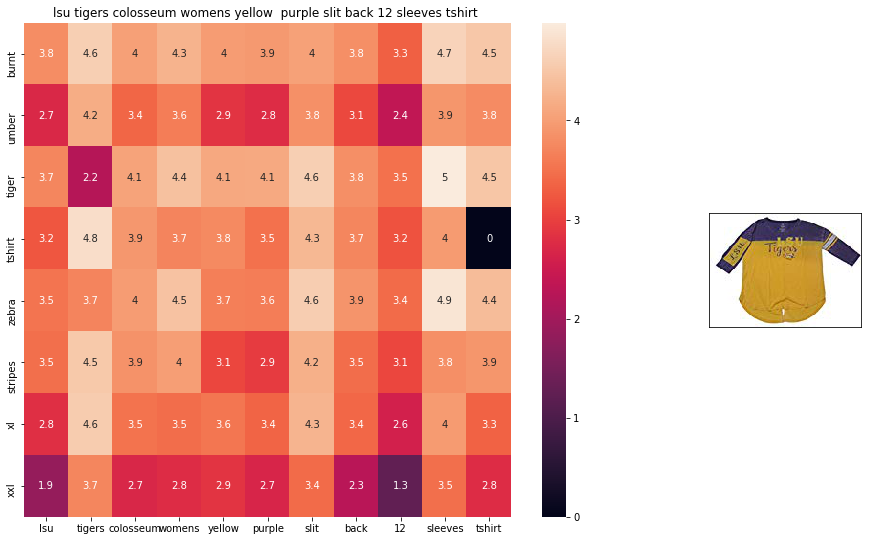

ASIN : B073R5Q8HD
BRAND : Colosseum
euclidean distance from given input image : 1.0229691


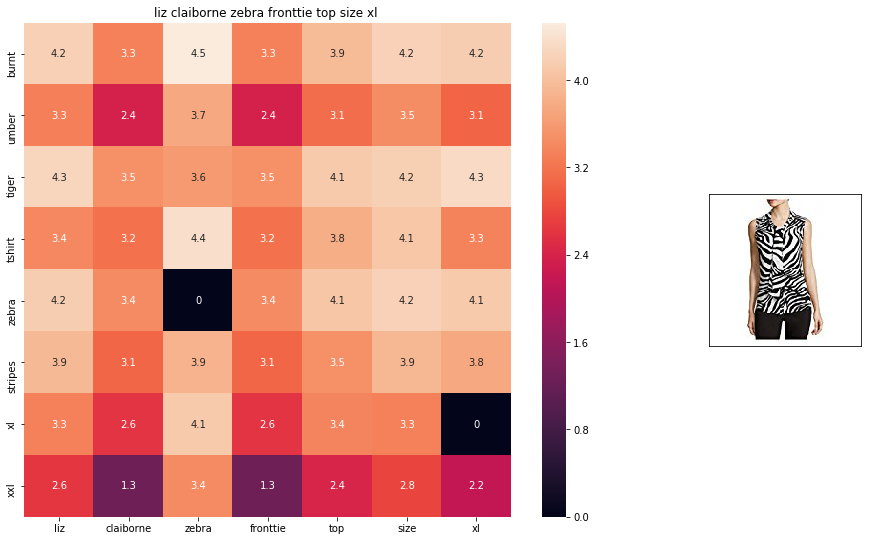

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
euclidean distance from given input image : 1.0669324


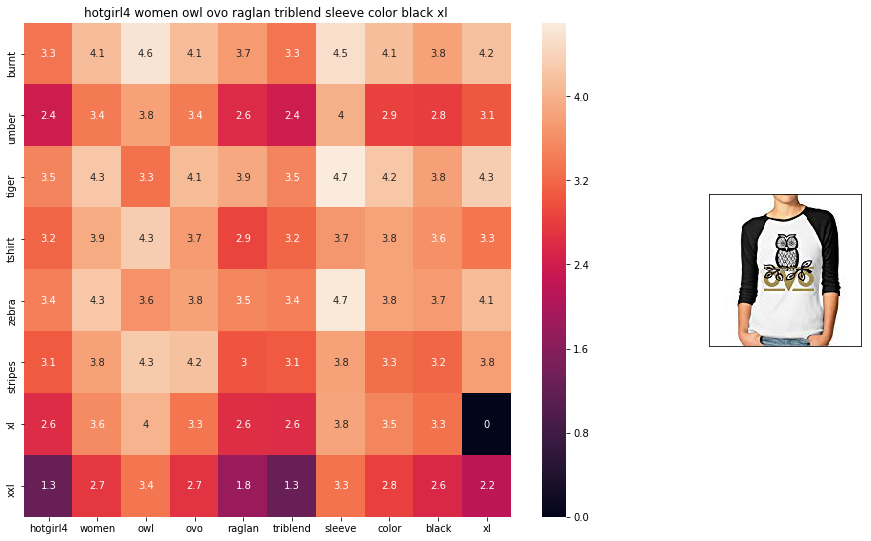

ASIN : B01L8L73M2
BRAND : Hotgirl4 Raglan Design
euclidean distance from given input image : 1.0731405


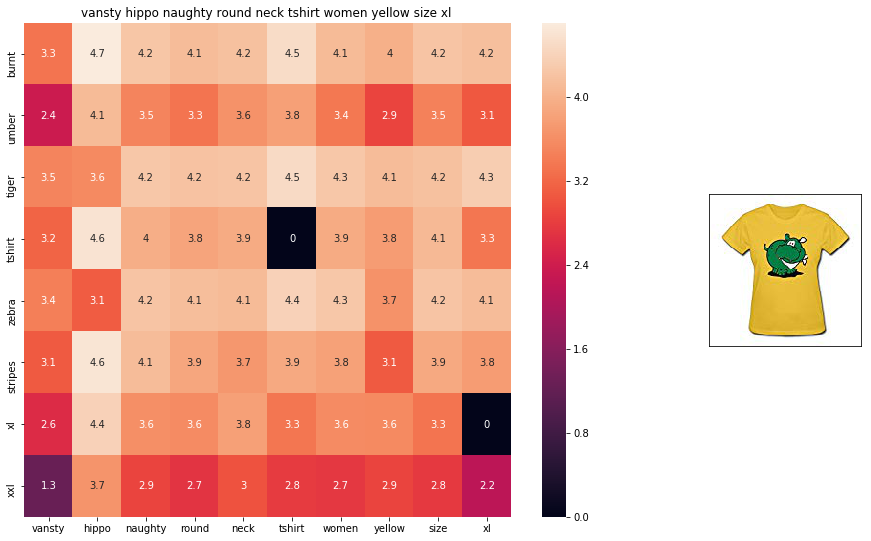

ASIN : B01EJS5H06
BRAND : Vansty
euclidean distance from given input image : 1.075719


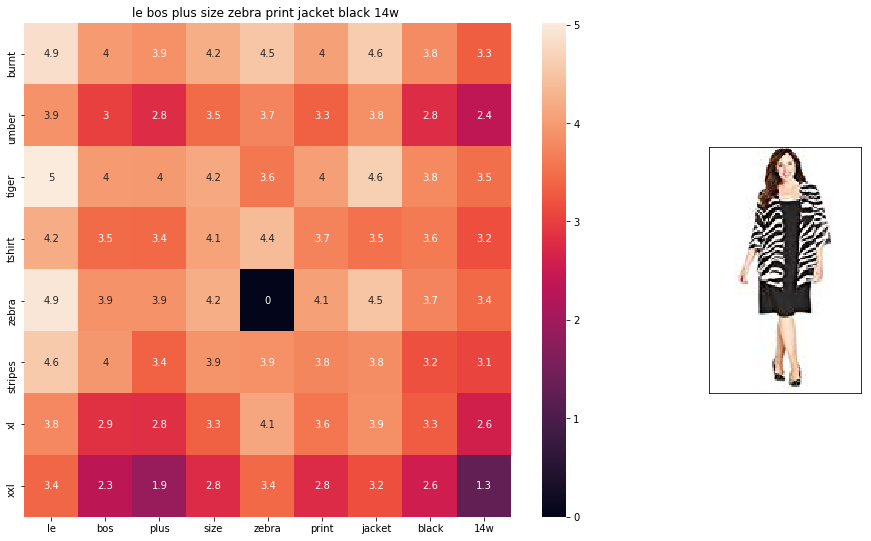

ASIN : B01BO1XRK8
BRAND : Le Bos
euclidean distance from given input image : 1.0839964


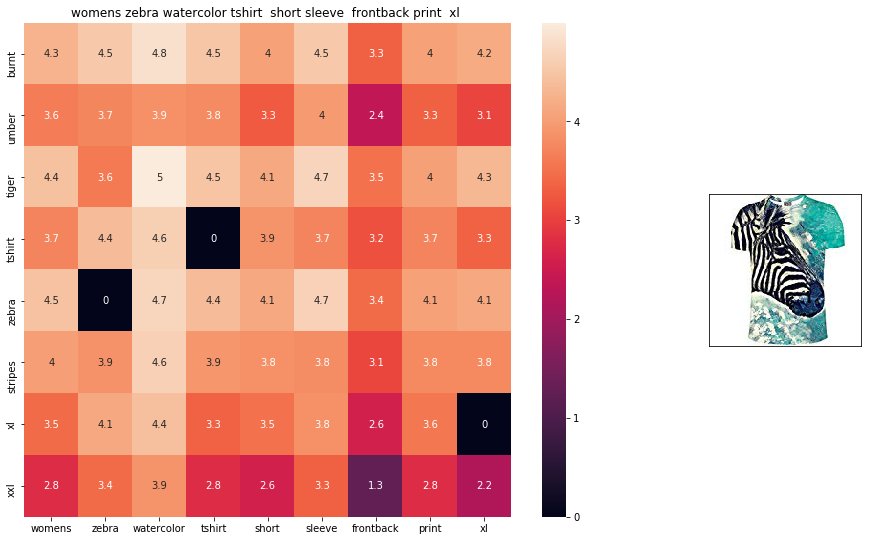

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
euclidean distance from given input image : 1.0842218


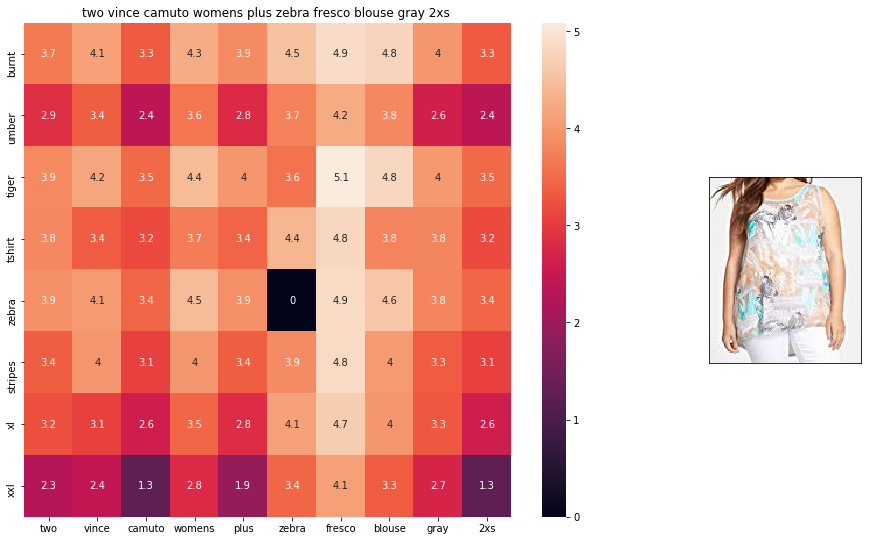

ASIN : B074MJRGW6
BRAND : Two by Vince Camuto
euclidean distance from given input image : 1.0895038


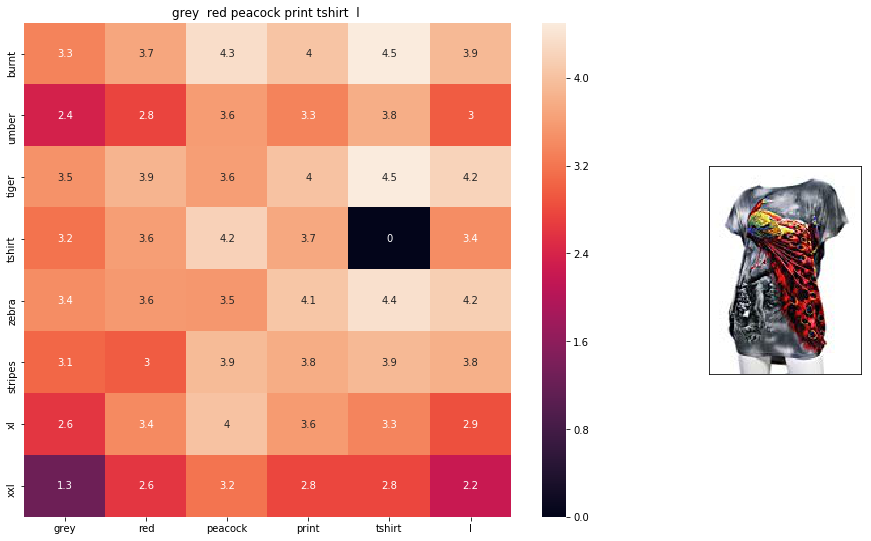

ASIN : B00JXQCFRS
BRAND : Si Row
euclidean distance from given input image : 1.0900588


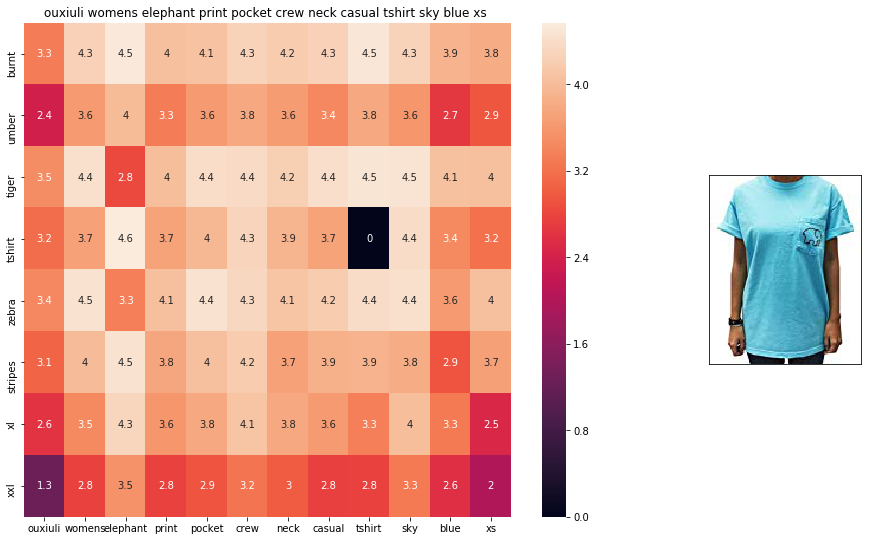

ASIN : B01I53HU6K
BRAND : ouxiuli
euclidean distance from given input image : 1.0920112


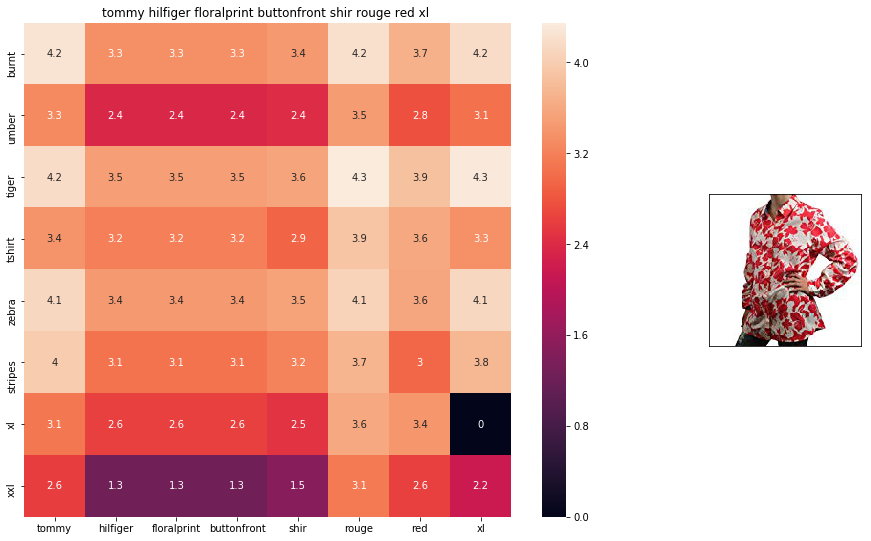

ASIN : B0711NGTQM
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.0923418


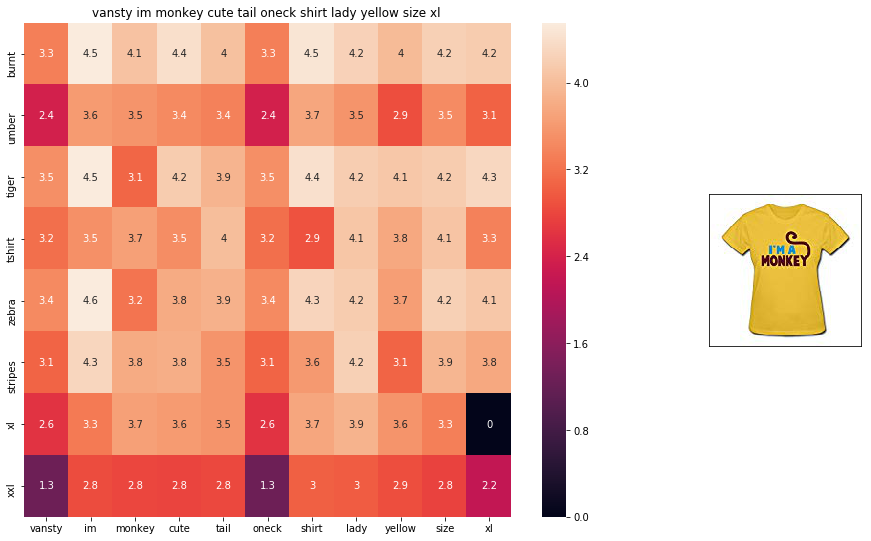

ASIN : B01EFSLO8Y
BRAND : Vansty
euclidean distance from given input image : 1.0934006


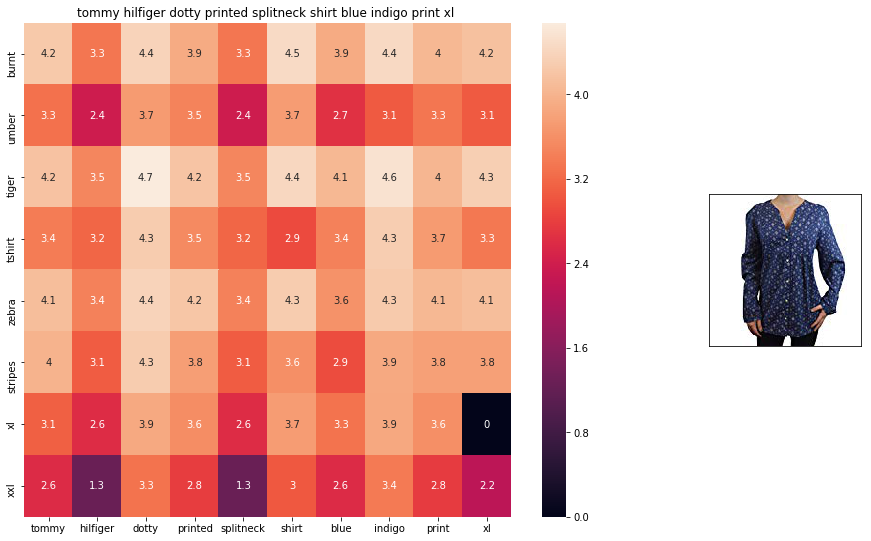

ASIN : B0716TVWQ4
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.0942026


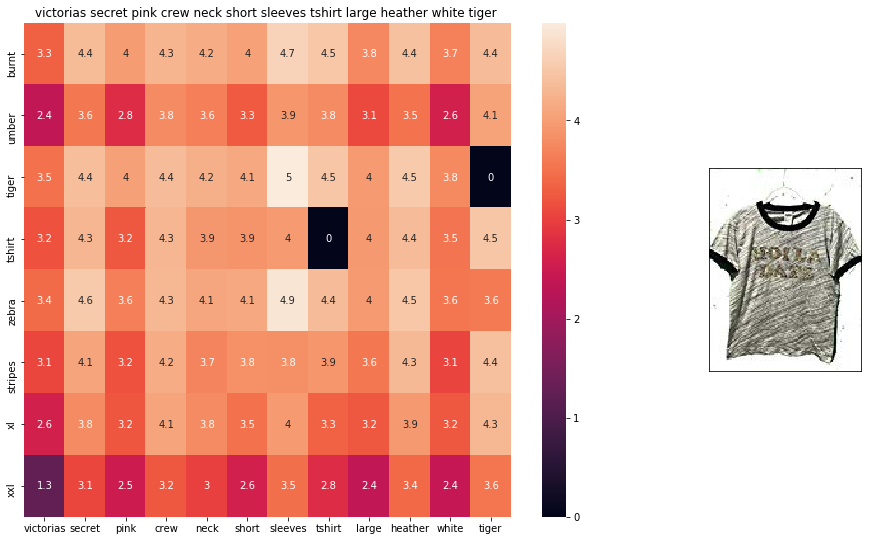

ASIN : B0716MVPGV
BRAND : V.Secret
euclidean distance from given input image : 1.0948305


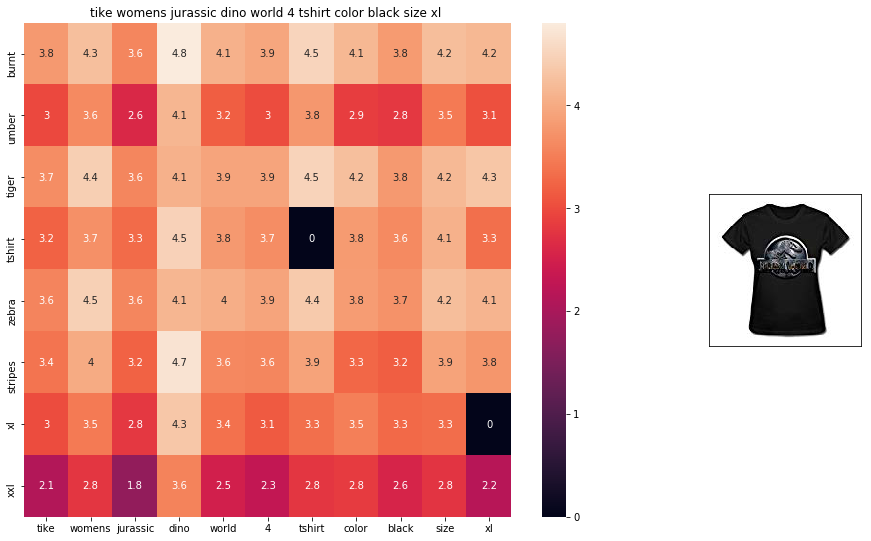

ASIN : B016OPN4OI
BRAND : TIKE Fashions
euclidean distance from given input image : 1.0951275


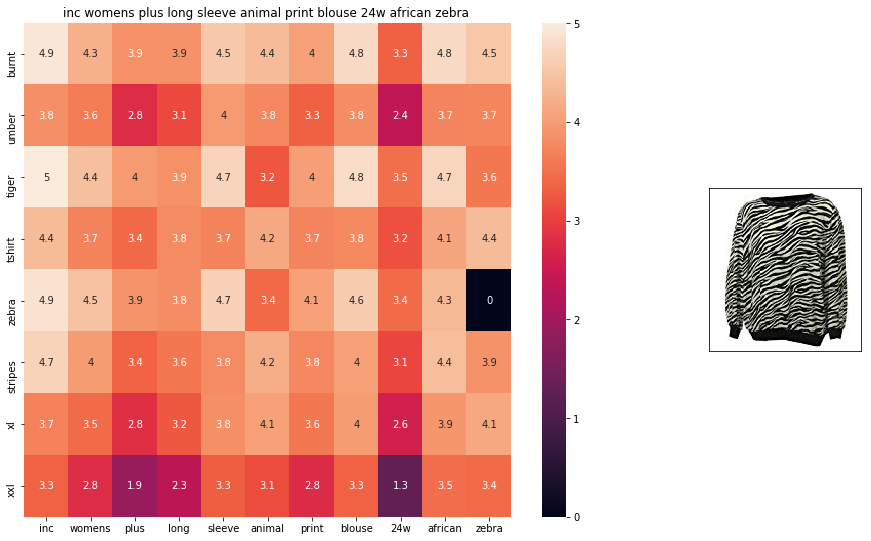

ASIN : B018WDJCUA
BRAND : INC - International Concepts Woman
euclidean distance from given input image : 1.0966892
Average euclidean distance is  0.9692112721124431


In [27]:
avg_w2v_model(12566, 20)

## 5. IDF WEIGHTED WORD2VEC BASED PRODUCT SIMILARITY

In [28]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

In [29]:
weighted_w2v_euclidean=[]
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        weighted_w2v_euclidean.append(pdists[i])
        print('euclidean distance from input :', pdists[i])
        print('='*125)
    print('Average euclidean distance is ',sum(weighted_w2v_euclidean)/num_results)

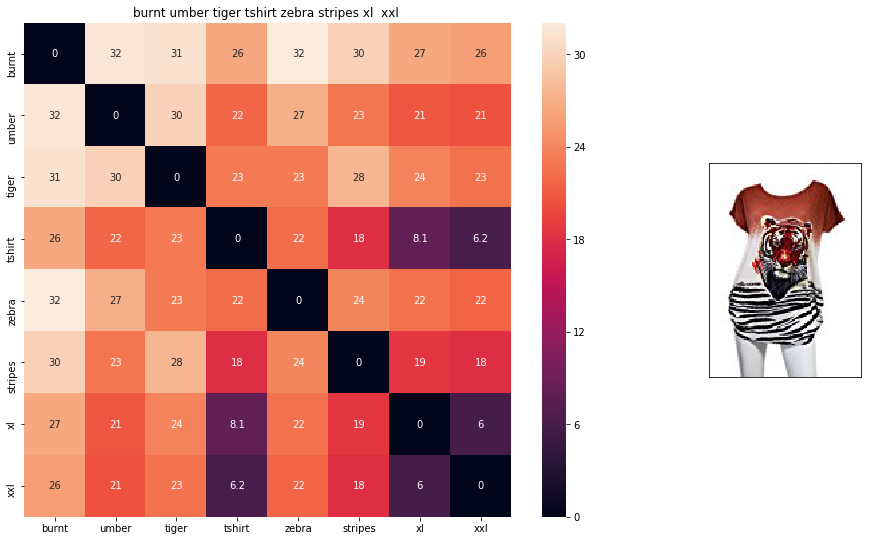

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.00390625


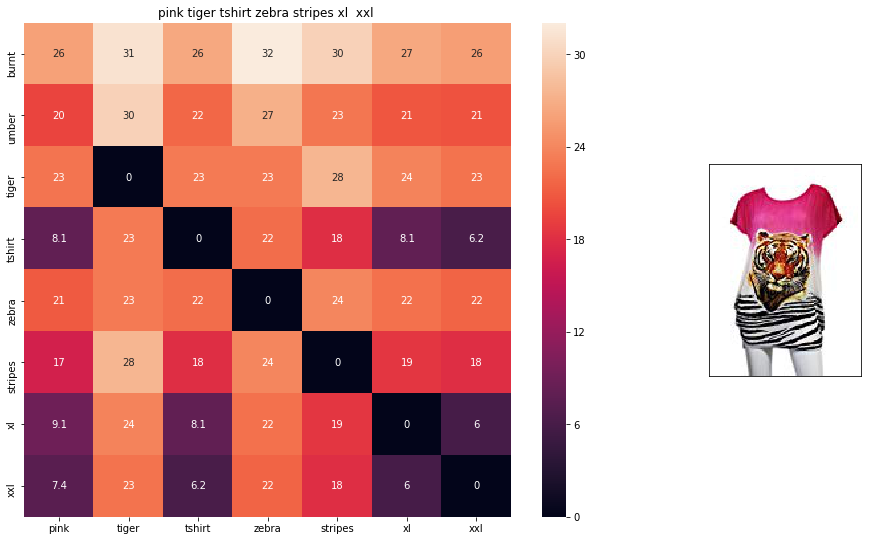

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 4.0638885


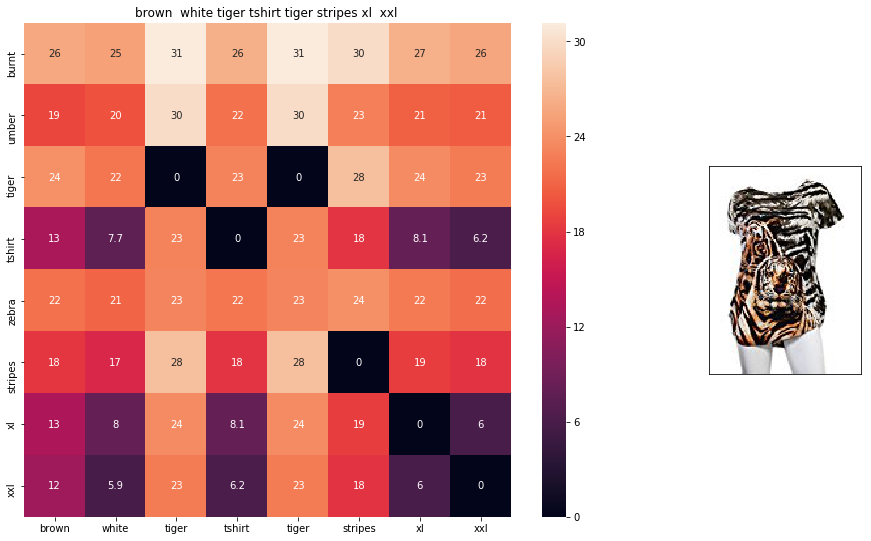

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 4.770942


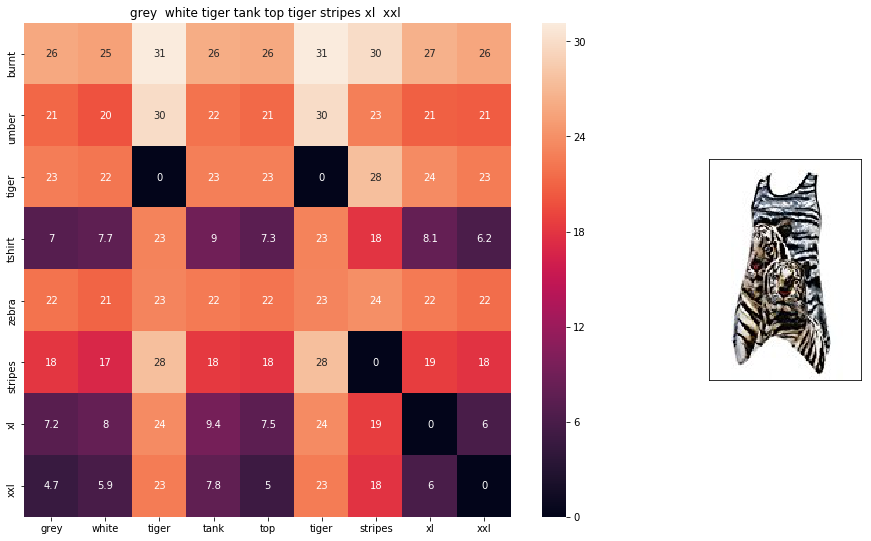

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 5.360161


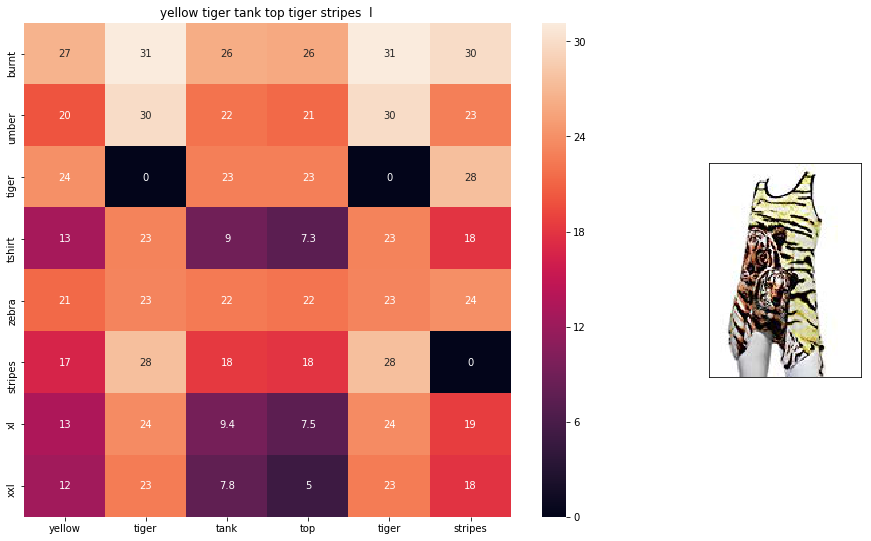

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 5.6895237


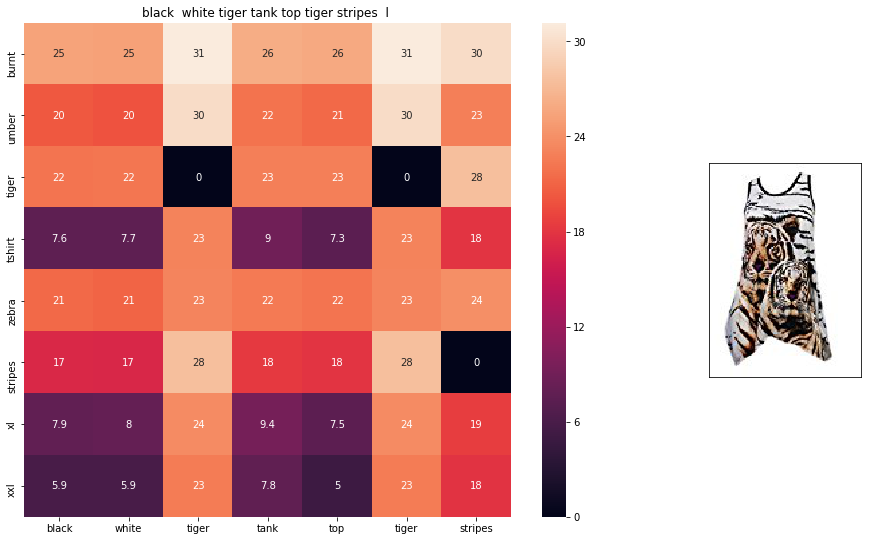

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 5.6930213


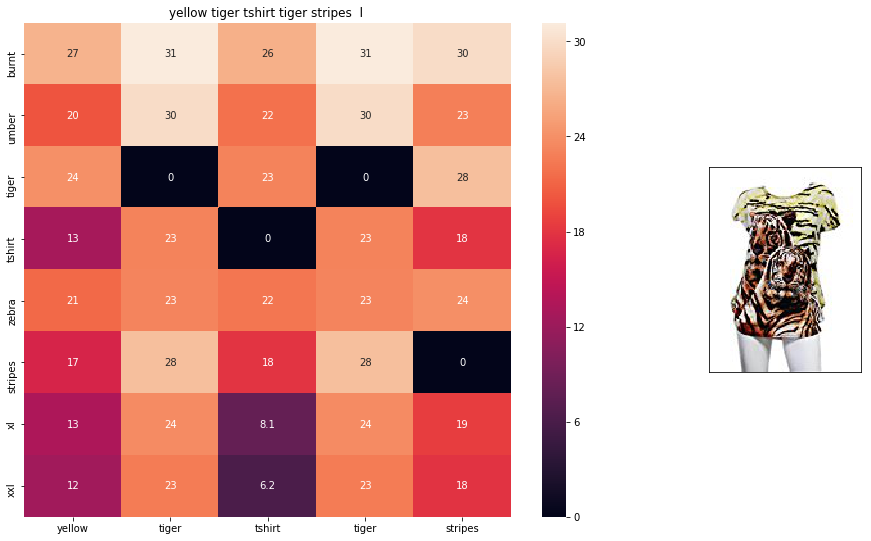

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 5.8934426


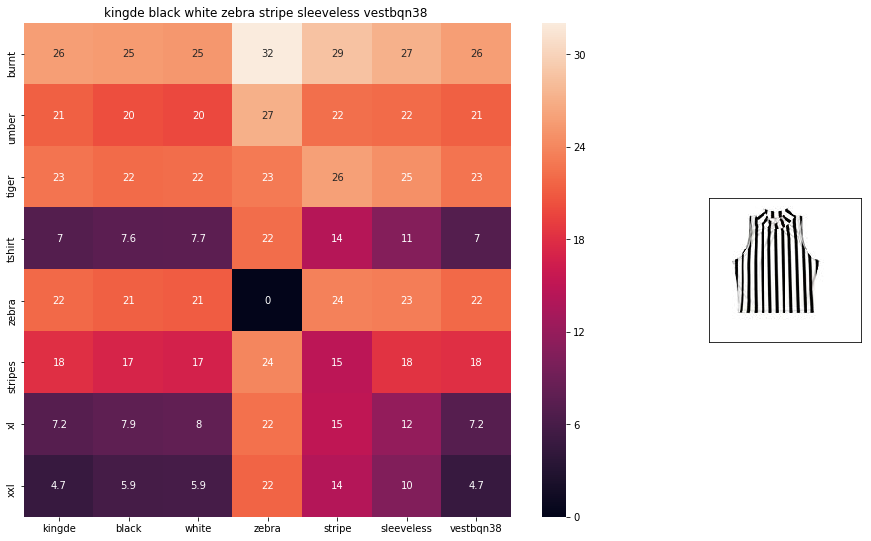

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 6.13299


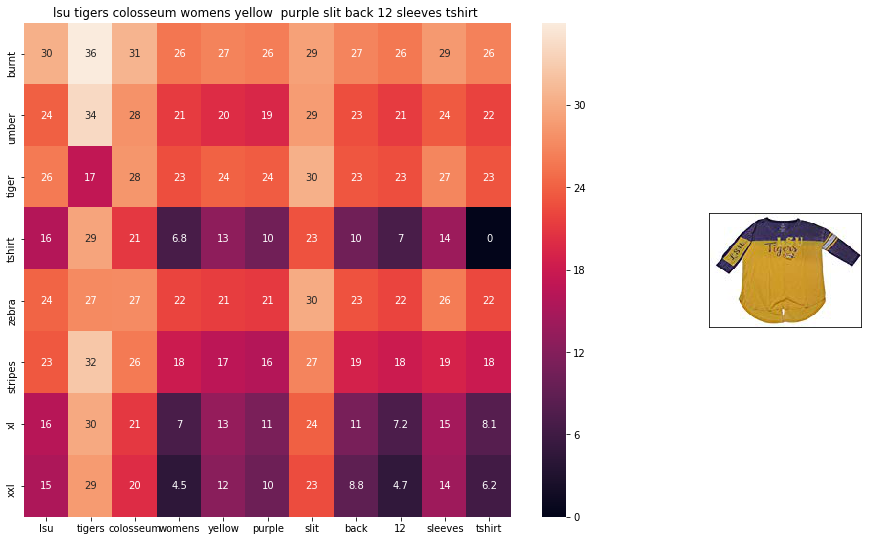

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 6.2567067


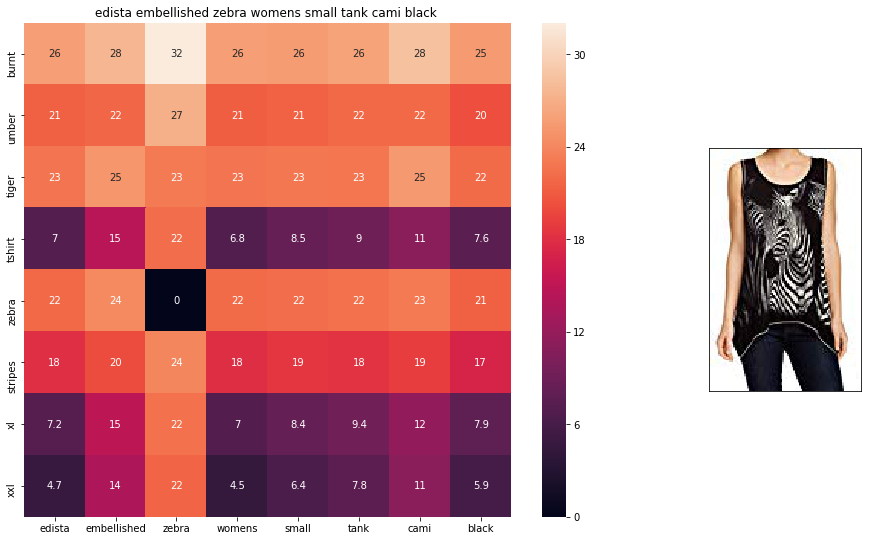

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 6.3922043


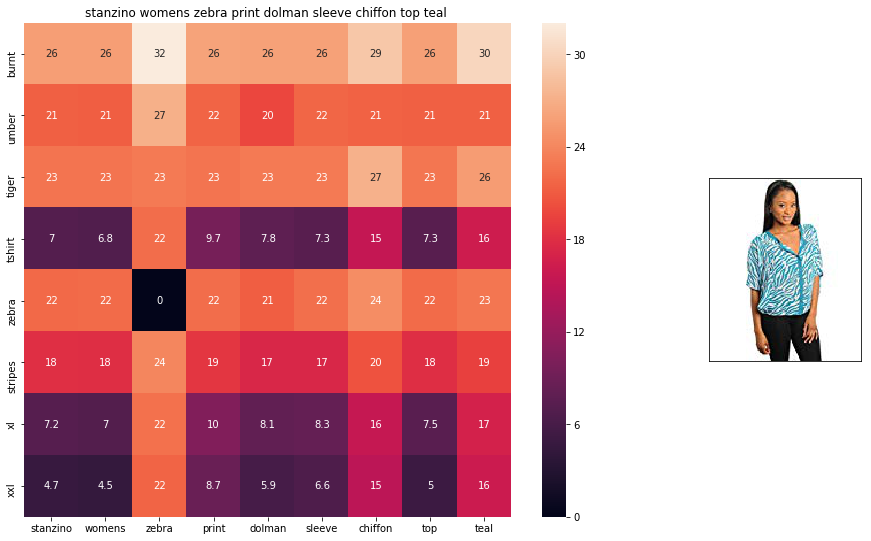

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 6.414901


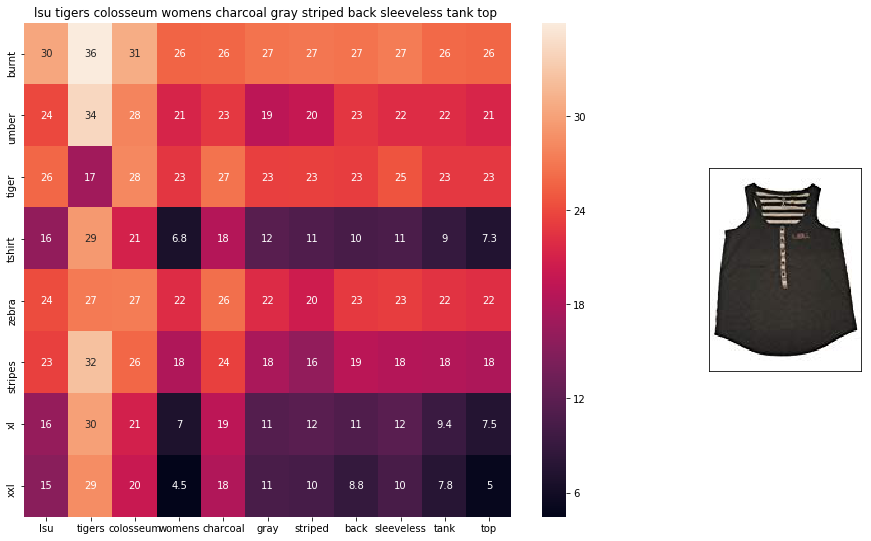

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 6.45096


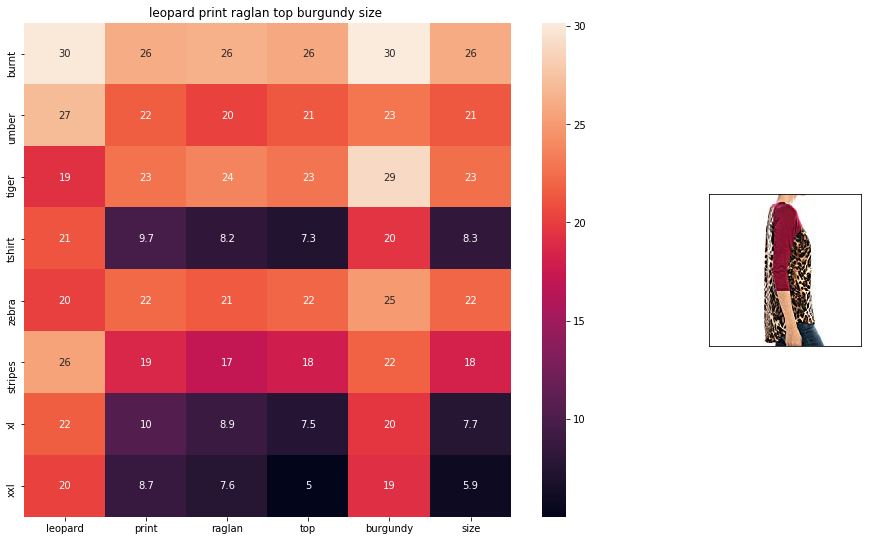

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 6.4634094


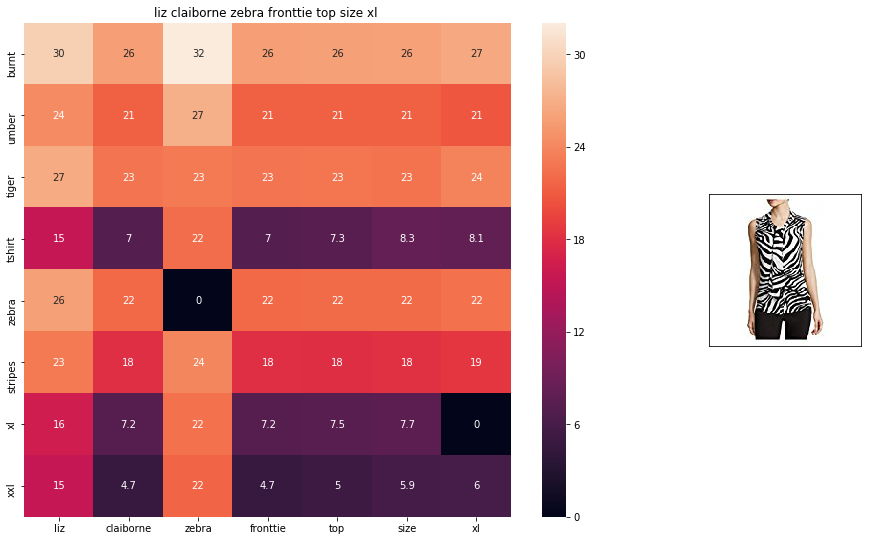

ASIN : B06XBY5QXL
Brand : Liz Claiborne
euclidean distance from input : 6.5392237


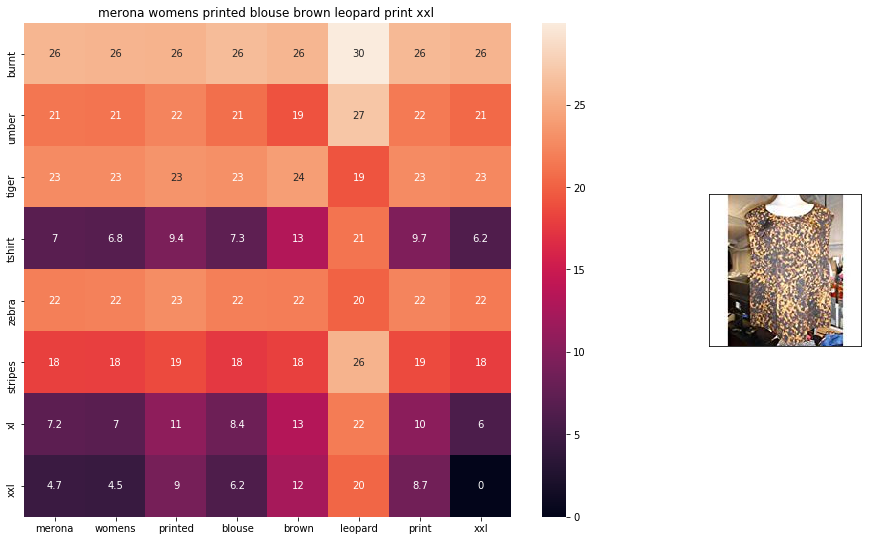

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 6.575504


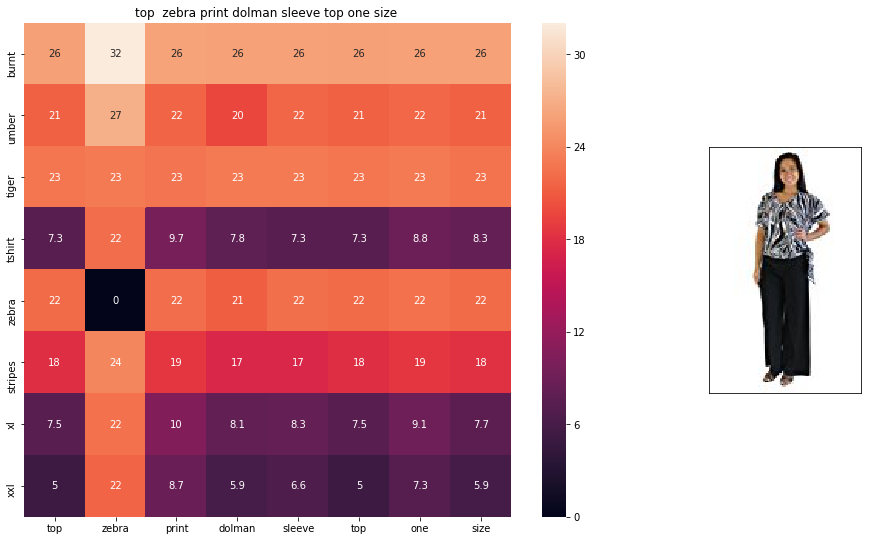

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from input : 6.6382155


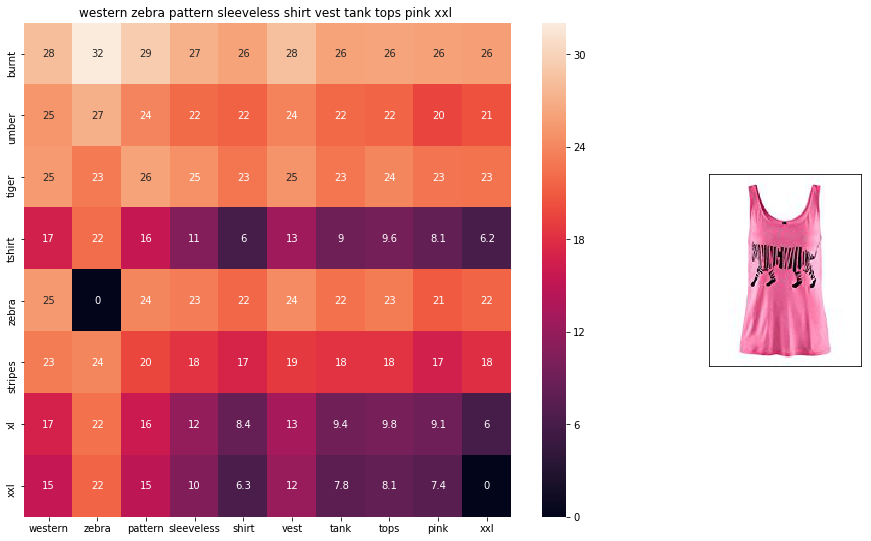

ASIN : B00Z6HEXWI
Brand : Black Temptation
euclidean distance from input : 6.660737


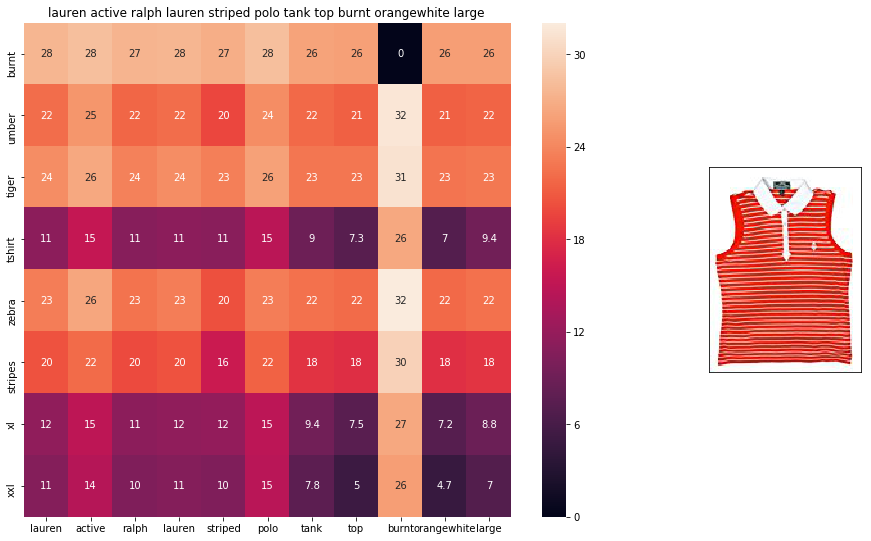

ASIN : B00ILGH5OY
Brand : Ralph Lauren Active
euclidean distance from input : 6.6839056


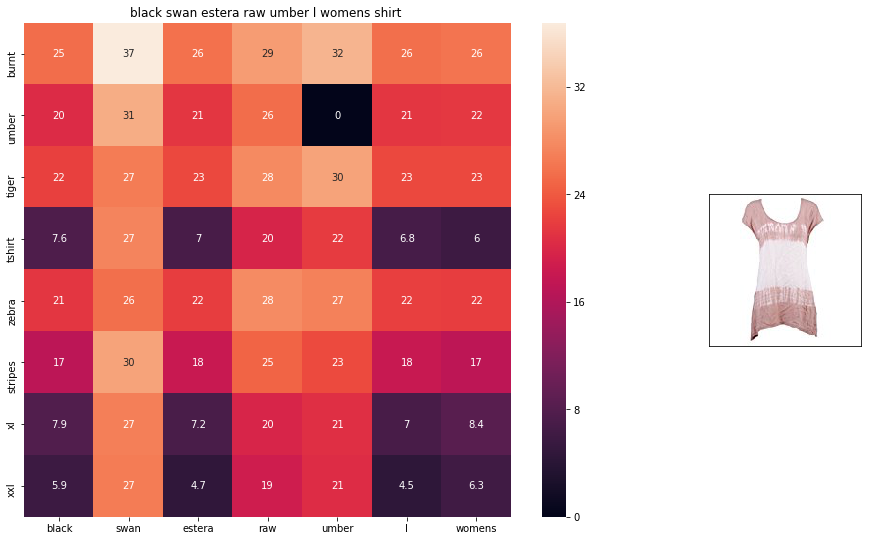

ASIN : B06Y1VN8WQ
Brand : Black Swan
euclidean distance from input : 6.7057643


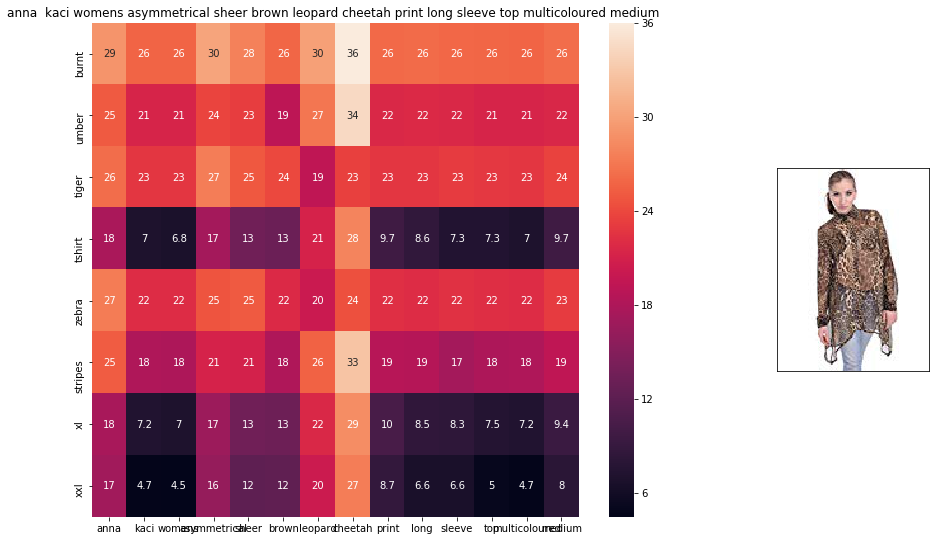

ASIN : B00KSNTY7Y
Brand : Anna-Kaci
euclidean distance from input : 6.706125
Average euclidean distance is  5.804776573181153


In [30]:
weighted_w2v_model(12566, 20)

## 6.WEIGHTED SIMILARITY USING BRAND AND COLOR

In [31]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [32]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [33]:
brand_colour_euclidean=[]
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        brand_colour_euclidean.append(pdists[i])
        print('euclidean distance from input :', pdists[i])
        print('='*125)
    print('Average euclidean distance is ',sum(brand_colour_euclidean)/num_results)

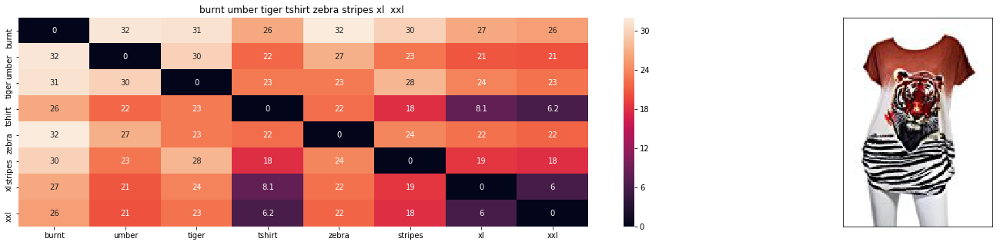

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.001953125


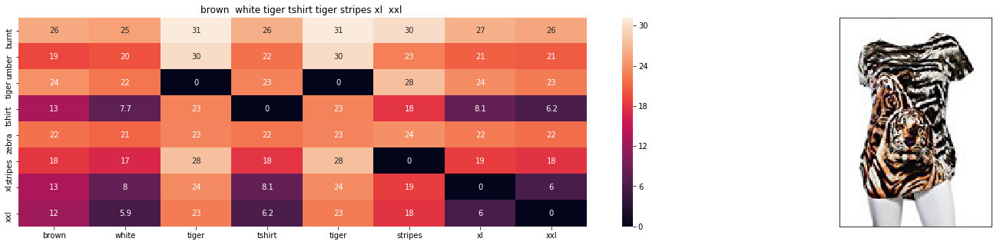

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 2.385471153259277


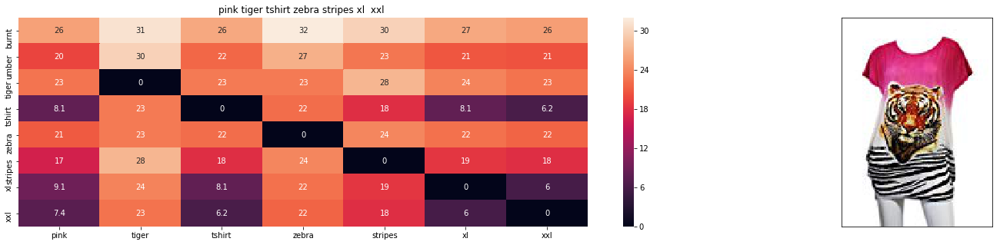

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 2.739051056088891


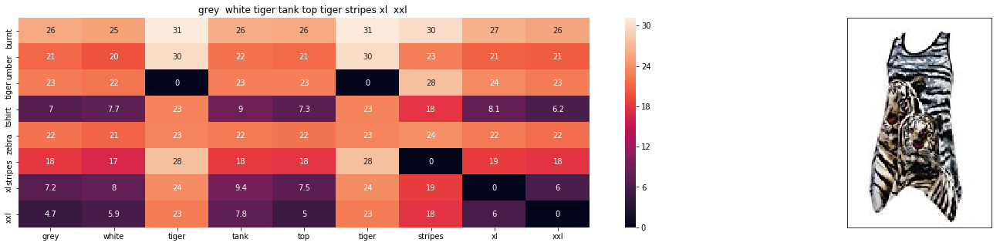

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 3.387187195004907


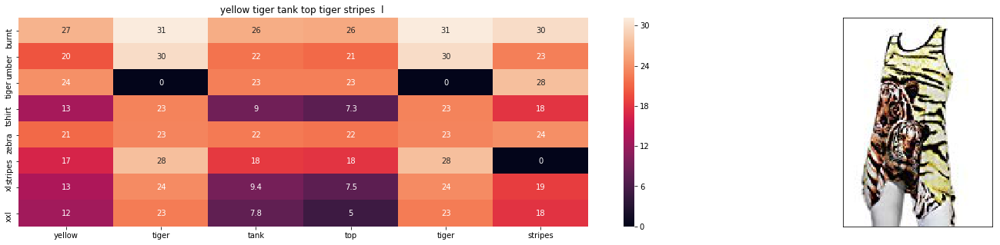

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 3.5518686296362545


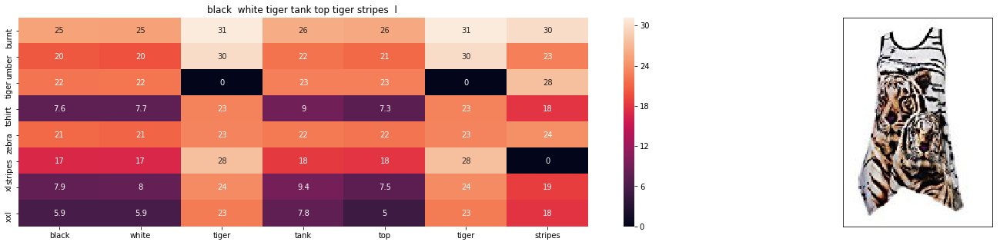

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 3.5536174775976805


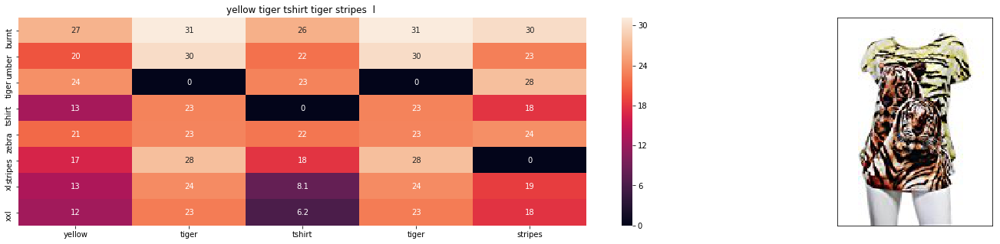

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 3.653828048886743


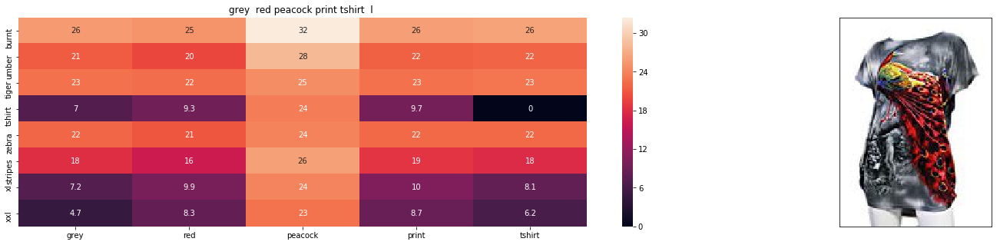

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 4.128811645688501


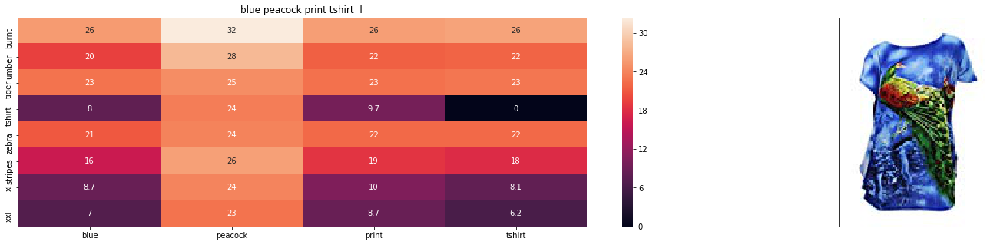

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 4.203900146665063


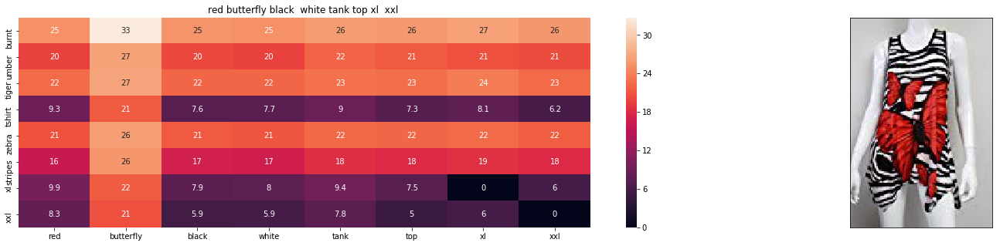

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 4.286586761655298


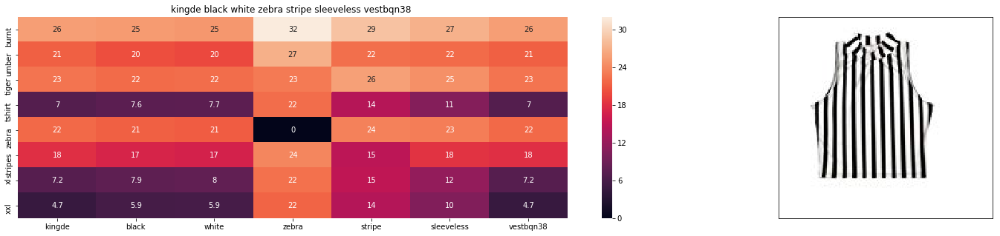

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 4.389370597243721


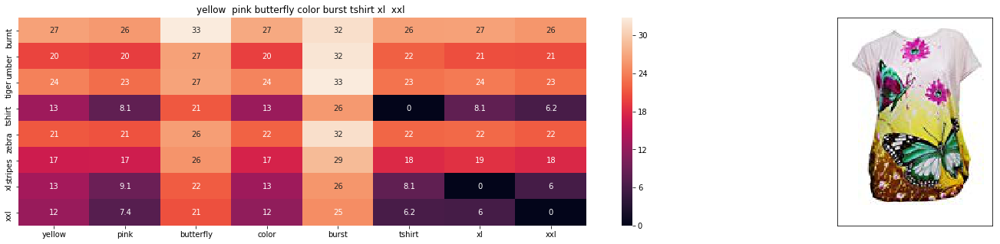

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 4.397910309018579


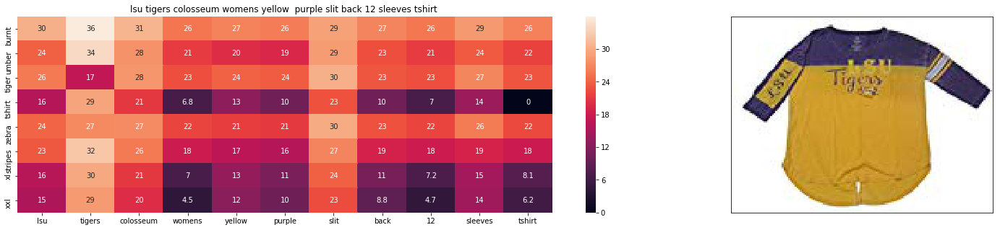

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 4.451228965163643


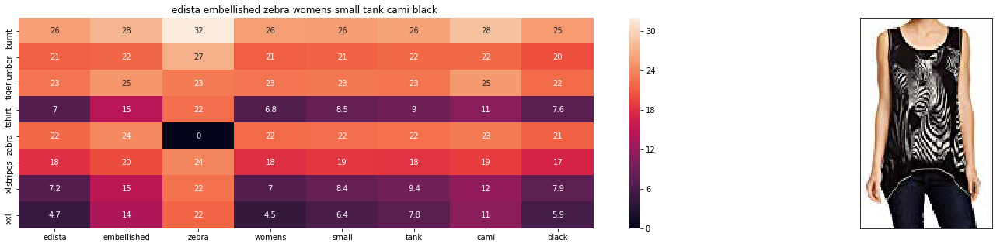

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 4.518977797866279


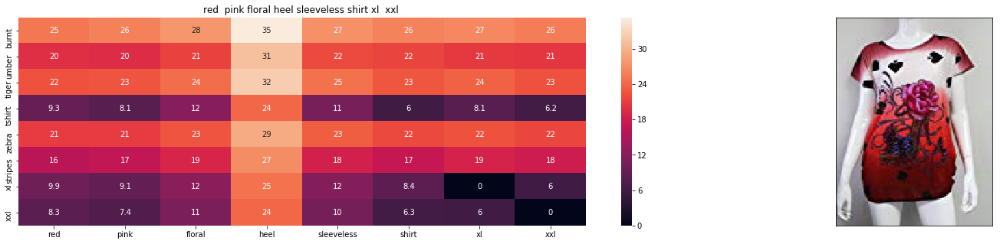

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 4.529375076474634


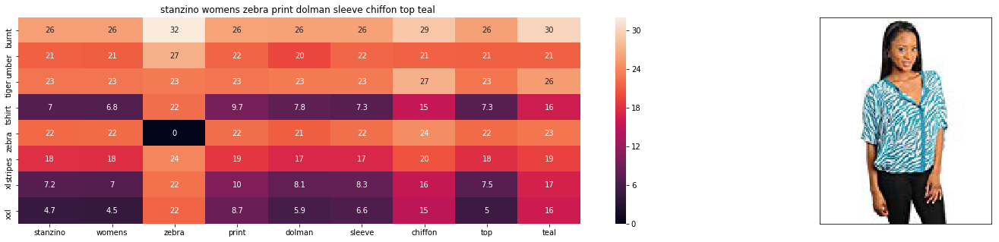

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 4.530326140761788


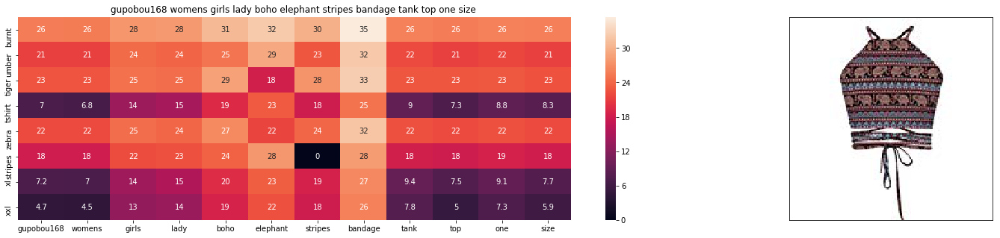

ASIN : B01ER184O6
Brand : GuPoBoU168
euclidean distance from input : 4.546817024028215


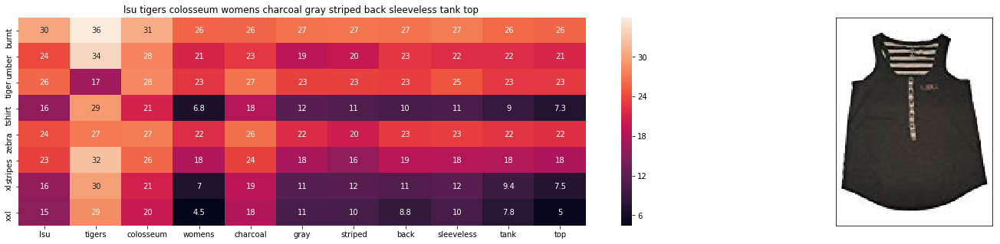

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 4.548355544448311


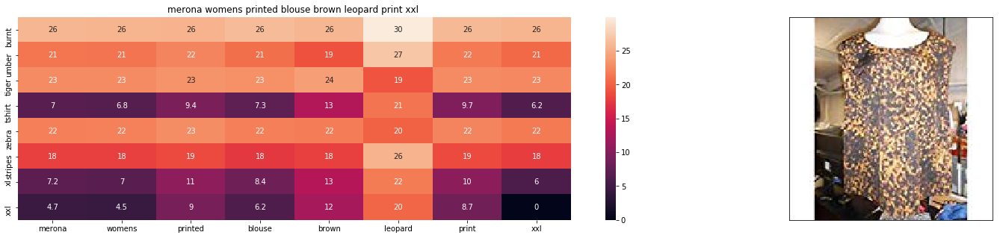

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 4.610627425551827


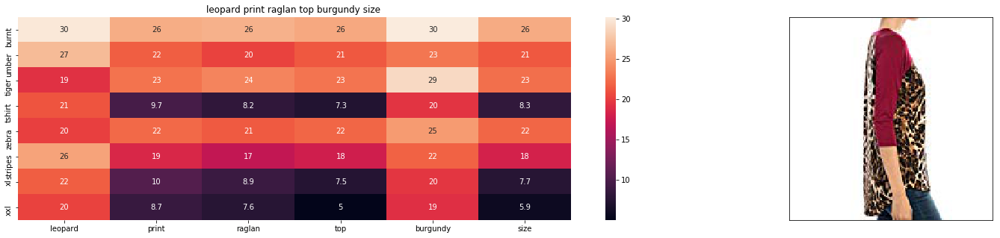

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 4.645918274287157
Average euclidean distance is  3.853059119716338


In [34]:
idf_w2v_brand(12566, 5, 5, 20)

## TENSOR FLOW TO EXTRACT FEATURES

In [33]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

## 7.VISUAL FEATURES BASED PRODUCT SIMILARITY

In [36]:
#Do NOT run this code unless you want to wait a few hours for it to generate output
# each image is converted into 25088 length dense-vector
'''
# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir = 'images2/'
nb_train_samples = 16042
epochs = 50
batch_size = 1


def save_bottlebeck_features():
    
    #Function to compute VGG-16 CNN for image feature extraction.
    
    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    
    # build the VGG16 network
    model = applications.VGG16(include_top=False, weights='imagenet')
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames:
        asins.append(i[2:-5])

    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)
    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))
    
    np.save(open('16k_data_cnn_features.npy', 'wb'), bottleneck_features_train)
    np.save(open('16k_data_cnn_feature_asins.npy', 'wb'), np.array(asins))
    

save_bottlebeck_features()

'''

"\n# dimensions of our images.\nimg_width, img_height = 224, 224\n\ntop_model_weights_path = 'bottleneck_fc_model.h5'\ntrain_data_dir = 'images2/'\nnb_train_samples = 16042\nepochs = 50\nbatch_size = 1\n\n\ndef save_bottlebeck_features():\n    \n    #Function to compute VGG-16 CNN for image feature extraction.\n    \n    asins = []\n    datagen = ImageDataGenerator(rescale=1. / 255)\n    \n    # build the VGG16 network\n    model = applications.VGG16(include_top=False, weights='imagenet')\n    generator = datagen.flow_from_directory(\n        train_data_dir,\n        target_size=(img_width, img_height),\n        batch_size=batch_size,\n        class_mode=None,\n        shuffle=False)\n\n    for i in generator.filenames:\n        asins.append(i[2:-5])\n\n    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)\n    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))\n    \n    np.save(open('16k_data_cnn_features.npy', 'w

### [Saved 16k_data_cnn_features_asins.npy](https://drive.google.com/file/d/1cQ7HJYfhJjYSN1I1wi_4ejl9AaW78uTJ/view?usp=sharing)

### [Saved 16k_data_cnn_features.npy](https://drive.google.com/file/d/1C1wesaQzomPVNcYp0MpW8Tn7Xuk2ugZf/view?usp=sharing)

In [37]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('pickels/16k_apparel_data_preprocessed')
df_asins = list(data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo

cnn_euclidean=[]
#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            cnn_euclidean.append(pdists[i])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])
    print('Average euclidean distance is ',sum(cnn_euclidean)/num_results)

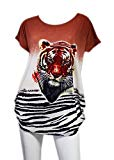

Product Title:  burnt umber tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 0.0625
Amazon Url: www.amzon.com/dp/B00JXQB5FQ


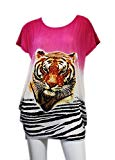

Product Title:  pink tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 30.050072
Amazon Url: www.amzon.com/dp/B00JXQASS6


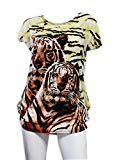

Product Title:  yellow tiger tshirt tiger stripes  l 
Euclidean Distance from input image: 41.261078
Amazon Url: www.amzon.com/dp/B00JXQCUIC


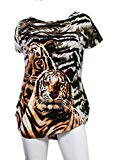

Product Title:  brown  white tiger tshirt tiger stripes xl  xxl 
Euclidean Distance from input image: 44.000187
Amazon Url: www.amzon.com/dp/B00JXQCWTO


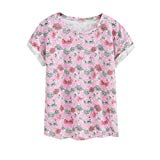

Product Title:  kawaii pastel tops tees pink flower design 
Euclidean Distance from input image: 47.38251
Amazon Url: www.amzon.com/dp/B071FCWD97


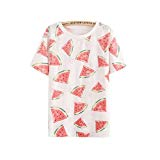

Product Title:  womens thin style tops tees pastel watermelon print 
Euclidean Distance from input image: 47.718403
Amazon Url: www.amzon.com/dp/B01JUNHBRM


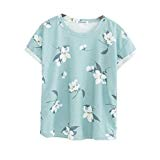

Product Title:  kawaii pastel tops tees baby blue flower design 
Euclidean Distance from input image: 47.9021
Amazon Url: www.amzon.com/dp/B071SBCY9W


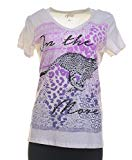

Product Title:  edv cheetah run purple multi xl 
Euclidean Distance from input image: 48.046516
Amazon Url: www.amzon.com/dp/B01CUPYBM0


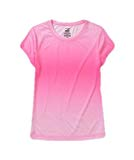

Product Title:  danskin womens vneck loose performance tee xsmall pink ombre 
Euclidean Distance from input image: 48.101917
Amazon Url: www.amzon.com/dp/B01F7PHXY8


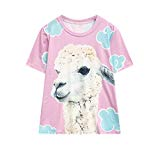

Product Title:  summer alpaca 3d pastel casual loose tops tee design 
Euclidean Distance from input image: 48.118877
Amazon Url: www.amzon.com/dp/B01I80A93G


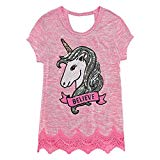

Product Title:  miss chievous juniors striped peplum tank top medium shadowpeach 
Euclidean Distance from input image: 48.13129
Amazon Url: www.amzon.com/dp/B0177DM70S


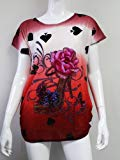

Product Title:  red  pink floral heel sleeveless shirt xl  xxl 
Euclidean Distance from input image: 48.16947
Amazon Url: www.amzon.com/dp/B00JV63QQE


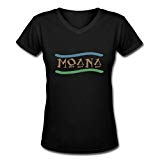

Product Title:  moana logo adults hot v neck shirt black xxl 
Euclidean Distance from input image: 48.25679
Amazon Url: www.amzon.com/dp/B01LX6H43D


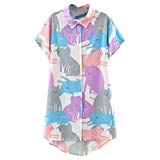

Product Title:  abaday multicolor cartoon cat print short sleeve longline shirt large 
Euclidean Distance from input image: 48.265633
Amazon Url: www.amzon.com/dp/B01CR57YY0


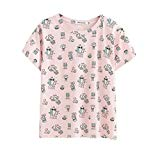

Product Title:  kawaii cotton pastel tops tees peach pink cactus design 
Euclidean Distance from input image: 48.362583
Amazon Url: www.amzon.com/dp/B071WYLBZS


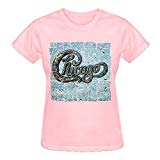

Product Title:  chicago chicago 18 shirt women pink 
Euclidean Distance from input image: 48.383617
Amazon Url: www.amzon.com/dp/B01GXAZTRY


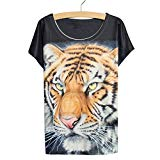

Product Title:  yichun womens tiger printed summer tshirts tops 
Euclidean Distance from input image: 48.449303
Amazon Url: www.amzon.com/dp/B010NN9RXO


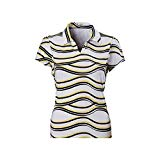

Product Title:  nancy lopez whimsy short sleeve  whiteblacklemon drop  xs 
Euclidean Distance from input image: 48.478912
Amazon Url: www.amzon.com/dp/B01MPX6IDX


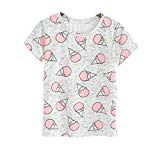

Product Title:  womens tops tees pastel peach ice cream cone print 
Euclidean Distance from input image: 48.557964
Amazon Url: www.amzon.com/dp/B0734GRKZL


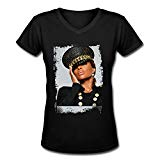

Product Title:  uswomens mary j blige without tshirts shirt 
Euclidean Distance from input image: 48.614376
Amazon Url: www.amzon.com/dp/B01M0XXFKK
Average euclidean distance is  44.315705108642575


In [38]:
get_similar_products_cnn(12566, 20)

### Comparing the models

In [39]:
euclidean_distance=[]
num_results=20
euclidean_distance.append(sum(bag_of_words_euclidean)/num_results)
euclidean_distance.append(sum(tf_idf_euclidean)/num_results)
euclidean_distance.append(sum(idf_euclidean)/num_results)
euclidean_distance.append(sum(avg_w2v_euclidean)/num_results)
euclidean_distance.append(sum(weighted_w2v_euclidean)/num_results)
euclidean_distance.append(sum(brand_colour_euclidean)/num_results)
euclidean_distance.append(sum(cnn_euclidean)/num_results)
x=euclidean_distance
y=[]
for i in range(0,47,7):
    y.append(i)

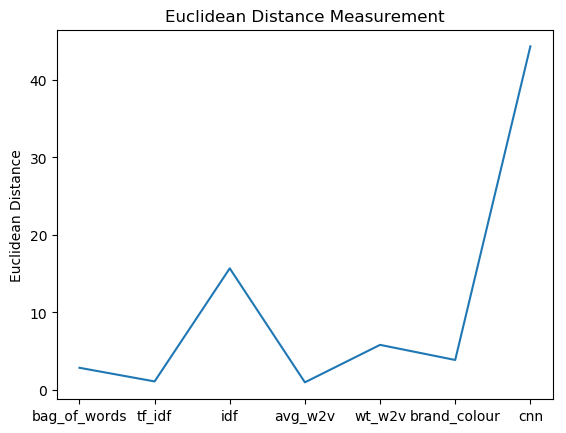

In [40]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
objects = ('bag_of_words', 'tf_idf', 'idf', 'avg_w2v', 'wt_w2v', 'brand_colour','cnn')
y_pos = np.arange(len(objects))
plt.plot(y,x)
plt.xticks(y, objects)
plt.ylabel('Euclidean Distance')
plt.title('Euclidean Distance Measurement')
 
plt.show()

<BarContainer object of 7 artists>

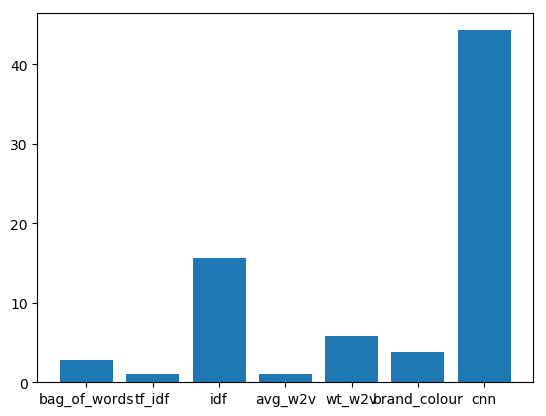

In [41]:
plt.bar(objects,x)